<a href="https://colab.research.google.com/github/shila121/projects/blob/main/employee_churn_model_w_strategic_retention_plan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [473]:
%pip install shap
%pip install lime

##1.Framing/Identifying the Problem Statement

<!-- The HR department seeks to develop a predictive model that identifies employees who are at risk of leaving the company. This model will help in proactively implementing targeted retention strategies and fostering a more stable and engaged workforce.

The goal of this project is to analyze historical employee data to identify key factors contributing to employee churn and build a predictive model that accurately forecasts the likelihood of an employee leaving the organization. By understanding the patterns and reasons behind employee attrition, the HR department aims to reduce turnover rates and improve employee satisfaction and retention.

This project would fall under what is commonly known as "HR Anlytics", "People Analytics" -->

<!-- Understanding why and when employees are most likely to leave can lead to actions to improve employee retention as well as possibly planning new hiring in advance.

In this study, we will attempt to solve the following problem statement is:

What is the likelihood of an active employee leaving the company?
What are the key indicators of an employee leaving the company?
What policies or strategies can be adopted based on the results to improve employee retention? -->


*   **Objective :**
Understand the factors leading to employee churn and develop a predictive model to identify employees at risk of leaving.

*   **Business Impact :**
By identifying potential churners, HR can proactively address issues, implement retention strategies, and reduce costs associated with employee turnover.


##2.Data Collection

1.**Internal Data Sources:**
Gather employee data from HR systems, such as:
o	Demographics (age, gender, education)
o	Employment details (job role, department, tenure, salary)
o	Performance data (appraisals, promotions)
o	Attendance records (leaves, absenteeism)
o	Engagement surveys (satisfaction, engagement scores)
o	Exit interviews (reasons for leaving)

2.**External Data Sources**
 (if applicable): Market data, industry trends, competitor analysis, etc.


##3.Data Understanding and Exploration


1.   Hypothesis Testing
2.   EDA(univariate/Bi-variate analysis)
3.   Missing data analysis
1.   Numerical data analysis
5.   Outliers analysis
6.   Categorical data analysis

In [474]:
# import the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

data = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
# visualize data

print(data.head())
print(data.columns,len(data.columns),data.shape)

# change Attrition column to numerical value
# Yes = 1, No = 0

data['Attrition'] = data['Attrition'].map({'Yes':1,'No':0})

print(data['Attrition'].unique())

   Age Attrition     BusinessTravel  DailyRate              Department  \
0   41       Yes      Travel_Rarely       1102                   Sales   
1   49        No  Travel_Frequently        279  Research & Development   
2   37       Yes      Travel_Rarely       1373  Research & Development   
3   33        No  Travel_Frequently       1392  Research & Development   
4   27        No      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  EmployeeCount  EmployeeNumber  \
0                 1          2  Life Sciences              1               1   
1                 8          1  Life Sciences              1               2   
2                 2          2          Other              1               4   
3                 3          4  Life Sciences              1               5   
4                 2          1        Medical              1               7   

   ...  RelationshipSatisfaction StandardHours  StockOptionLevel  \
0  ...

In [475]:
data['Attrition'].value_counts()/data.shape[0]

,count
Attrition,
0,0.838776
1,0.161224


In [476]:
# categorical data and numerical data
catCols = data.select_dtypes('object').columns

print('categorical columns of data:',catCols,len(catCols))
# get numerical columns of data
numCols  = data.select_dtypes('number').columns

print('numerical columns of data:',numCols,len(numCols))

categorical columns of data: Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object') 8
numerical columns of data: Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object') 27


###3.1 Numerical data analysis
<!--
Numerical data analysis involves examining and interpreting numerical (continuous or discrete) variables to uncover patterns, trends, and relationships that might inform the understanding of your dataset. In the context of an employee churn project, this process can provide valuable insights into how numerical features, such as age, salary, years at the company, and monthly income, influence employee churn. -->

In [477]:
# -> 1. visualize numerical columns
print('numerical columns:',numCols,len(numCols))
print(data[numCols].head())

numerical columns: Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object') 27
   Age  Attrition  DailyRate  DistanceFromHome  Education  EmployeeCount  \
0   41          1       1102                 1          2              1   
1   49          0        279                 8          1              1   
2   37          1       1373                 2          2              1   
3   33          0       1392                 3          4              1   
4   

In [478]:
# 2.Summary statistics for numerical columns
print(data[numCols].describe())

               Age    Attrition    DailyRate  DistanceFromHome    Education  \
count  1470.000000  1470.000000  1470.000000       1470.000000  1470.000000   
mean     36.923810     0.161224   802.485714          9.192517     2.912925   
std       9.135373     0.367863   403.509100          8.106864     1.024165   
min      18.000000     0.000000   102.000000          1.000000     1.000000   
25%      30.000000     0.000000   465.000000          2.000000     2.000000   
50%      36.000000     0.000000   802.000000          7.000000     3.000000   
75%      43.000000     0.000000  1157.000000         14.000000     4.000000   
max      60.000000     1.000000  1499.000000         29.000000     5.000000   

       EmployeeCount  EmployeeNumber  EnvironmentSatisfaction   HourlyRate  \
count         1470.0     1470.000000              1470.000000  1470.000000   
mean             1.0     1024.865306                 2.721769    65.891156   
std              0.0      602.024335                 1

In [479]:
# ->3. Analysis of discrete and continuous numerical data

discrete_numCols = [var for var in numCols if len(data[var].unique()) < 20]
print('discrete  numericals columns:',discrete_numCols,len(discrete_numCols))

cont_numCols = [var for var in numCols if len(data[var].unique())>20]
print('continuous numerical columns:',cont_numCols,len(cont_numCols))

# visualize discrete columns
data[discrete_numCols].head()

data[discrete_numCols].head()

discrete  numericals columns: ['Attrition', 'Education', 'EmployeeCount', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager'] 18
continuous numerical columns: ['Age', 'DailyRate', 'DistanceFromHome', 'EmployeeNumber', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'TotalWorkingYears', 'YearsAtCompany'] 9


,Attrition,Education,EmployeeCount,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,2,1,2,3,2,4,8,11,3,1,80,0,0,1,4,0,5
1,0,1,1,3,2,2,2,1,23,4,4,80,1,3,3,7,1,7
2,1,2,1,4,2,1,3,6,15,3,2,80,0,3,3,0,0,0
3,0,4,1,4,3,1,3,1,11,3,3,80,0,3,3,7,3,0
4,0,1,1,1,3,1,2,9,12,3,4,80,1,3,3,2,2,2


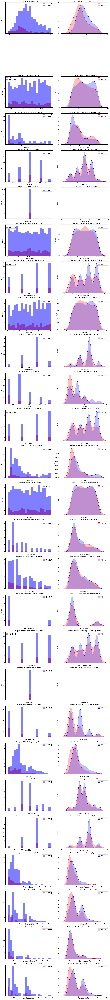

In [480]:
# ->4. Analyze Numeric Columns Against the Target
import matplotlib.pyplot as plt
import seaborn as sns
target_col = 'Attrition'

numeric_cols = numCols  # List of numeric columns

# Set up the plotting area
plt.figure(figsize=(15, len(numeric_cols) * 5))
# Loop through each numeric column

for index, col in enumerate(numeric_cols, 1):
    if col == target_col:
        continue  # Skip the target column itself

    # Histogram to compare distribution between churned and non-churned
    plt.subplot(len(numeric_cols), 2, index * 2 - 1)
    plt.hist(data[col][data[target_col] == 1], bins=20, alpha=0.5, label='Attrition = 1', color='red')
    plt.hist(data[col][data[target_col] == 0], bins=20, alpha=0.5, label='Attrition = 0', color='blue')
    plt.title(f'Histogram of {col} by {target_col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()  # Add legend here to ensure it's included in the plot

    # Dist plot (KDE) to see the density and distribution differences
    plt.subplot(len(numeric_cols), 2, index * 2)
    sns.kdeplot(data[col][data[target_col] == 1], label='Attrition = 1', color='red', fill=True, common_norm=False)
    sns.kdeplot(data[col][data[target_col] == 0], label='Attrition = 0', color='blue', fill=True, common_norm=False)
    plt.title(f'Distribution Plot of {col} by {target_col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()  # Add legend here to ensure it's included in the plot

plt.tight_layout()
plt.show()

###3.2.Categorical data analysis

In [481]:
print('categorical columns:',catCols,len(catCols))

#->1. visualize categorical variables
data[catCols].head()

categorical columns: Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object') 8


,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No


In [482]:
# ->2.cardinality of categorical variables
print(data[catCols].nunique())

BusinessTravel    3
Department        3
EducationField    6
Gender            2
JobRole           9
MaritalStatus     3
Over18            1
OverTime          2
dtype: int64


Rare Categories in BusinessTravel (less than 5.0% of total): []
Rare Categories in Department (less than 5.0% of total): ['Human Resources']
Rare Categories in EducationField (less than 5.0% of total): ['Human Resources']
Rare Categories in Gender (less than 5.0% of total): []
Rare Categories in JobRole (less than 5.0% of total): ['Human Resources']
Rare Categories in MaritalStatus (less than 5.0% of total): []
Rare Categories in Over18 (less than 5.0% of total): []
Rare Categories in OverTime (less than 5.0% of total): []


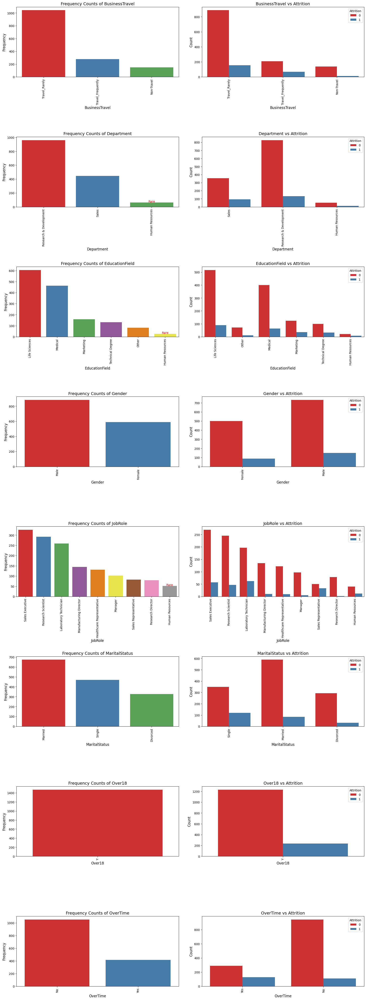

In [483]:
# 3.Analyze categorical columns Against the Target
categorical_cols = catCols

threshold = 0.05

# Set up the plotting area with larger figure size and adjusted spacing
plt.figure(figsize=(18, len(categorical_cols) * 6))  # Adjust size as needed

# Get the colors from Seaborn's Set1 palette
palette = sns.color_palette('Set1')

# Loop through each categorical column
for index, col in enumerate(categorical_cols, 1):
    # Calculate frequency of each category
    category_counts = data[col].value_counts()
    total_count = len(data)

    # Identify rare categories
    rare_categories = category_counts[category_counts / total_count < threshold].index
    print(f'Rare Categories in {col} (less than {threshold * 100}% of total): {list(rare_categories)}')

    # Plot frequency counts with indication of rare categories
    plt.subplot(len(categorical_cols), 2, index * 2 - 1)
    sns.barplot(x=category_counts.index, y=category_counts.values, palette=palette)
    plt.title(f'Frequency Counts of {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.xticks(rotation=90, fontsize=10)  # Rotate x-axis labels if necessary

    # Highlight rare categories with the correct color
    for i, cat in enumerate(category_counts.index):
        color = 'red' if cat in rare_categories else palette[i % len(palette)]
        plt.text(i, category_counts[cat], 'Rare' if cat in rare_categories else '', color=color, ha='center', fontsize=10)

    # Plot relationship with target variable
    plt.subplot(len(categorical_cols), 2, index * 2)
    sns.countplot(x=col, hue=target_col, data=data, palette='Set1')
    plt.title(f'{col} vs {target_col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=90, fontsize=10)  # Rotate x-axis labels if necessary

plt.tight_layout(pad=3.0)  # Adjust padding between subplots
plt.show()


###3.3.1 EDA(UNIVARIATE - NUMERICAL DATA)

Descriptive Statistics for Numeric Columns:
               Age    Attrition    DailyRate  DistanceFromHome    Education  \
count  1470.000000  1470.000000  1470.000000       1470.000000  1470.000000   
mean     36.923810     0.161224   802.485714          9.192517     2.912925   
std       9.135373     0.367863   403.509100          8.106864     1.024165   
min      18.000000     0.000000   102.000000          1.000000     1.000000   
25%      30.000000     0.000000   465.000000          2.000000     2.000000   
50%      36.000000     0.000000   802.000000          7.000000     3.000000   
75%      43.000000     0.000000  1157.000000         14.000000     4.000000   
max      60.000000     1.000000  1499.000000         29.000000     5.000000   

       EmployeeCount  EmployeeNumber  EnvironmentSatisfaction   HourlyRate  \
count         1470.0     1470.000000              1470.000000  1470.000000   
mean             1.0     1024.865306                 2.721769    65.891156   
std       

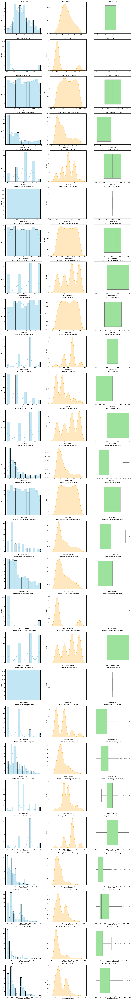


Age - Summary Statistics:
count    1470.000000
mean       36.923810
std         9.135373
min        18.000000
25%        30.000000
50%        36.000000
75%        43.000000
max        60.000000
Name: Age, dtype: float64


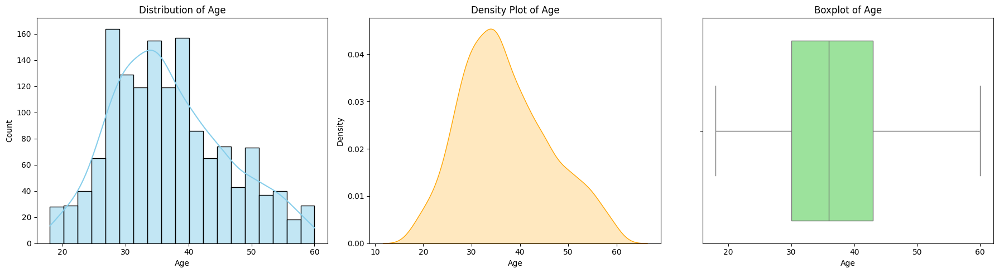


Attrition - Summary Statistics:
count    1470.000000
mean        0.161224
std         0.367863
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Attrition, dtype: float64


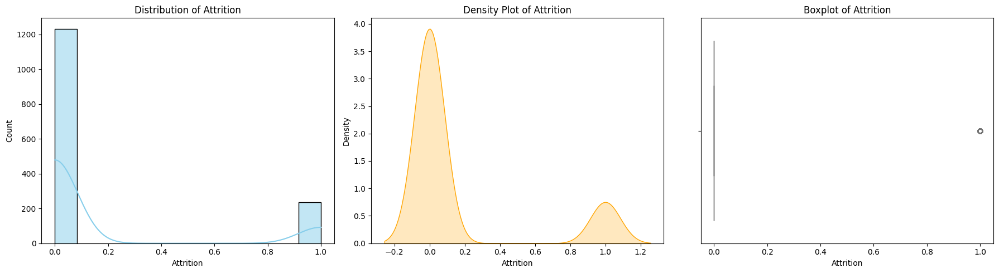


DailyRate - Summary Statistics:
count    1470.000000
mean      802.485714
std       403.509100
min       102.000000
25%       465.000000
50%       802.000000
75%      1157.000000
max      1499.000000
Name: DailyRate, dtype: float64


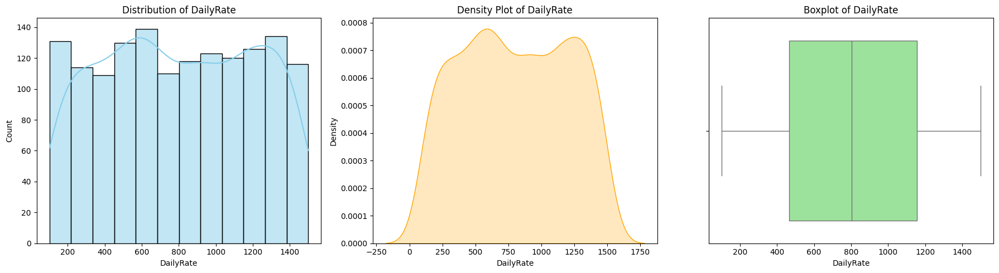


DistanceFromHome - Summary Statistics:
count    1470.000000
mean        9.192517
std         8.106864
min         1.000000
25%         2.000000
50%         7.000000
75%        14.000000
max        29.000000
Name: DistanceFromHome, dtype: float64


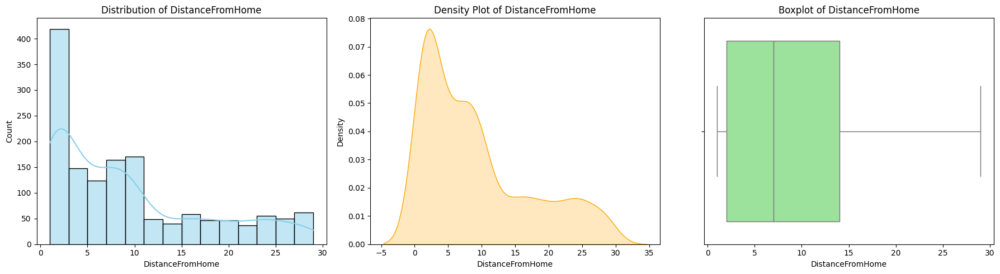


Education - Summary Statistics:
count    1470.000000
mean        2.912925
std         1.024165
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: Education, dtype: float64


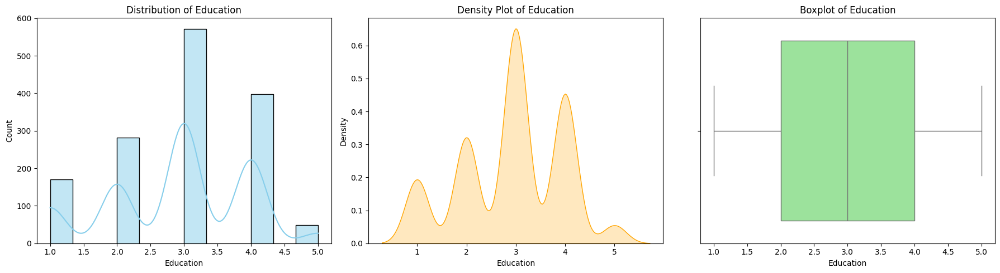


EmployeeCount - Summary Statistics:
count    1470.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: EmployeeCount, dtype: float64


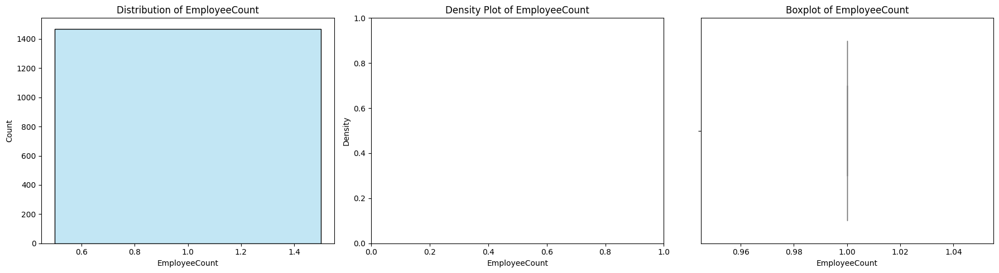


EmployeeNumber - Summary Statistics:
count    1470.000000
mean     1024.865306
std       602.024335
min         1.000000
25%       491.250000
50%      1020.500000
75%      1555.750000
max      2068.000000
Name: EmployeeNumber, dtype: float64


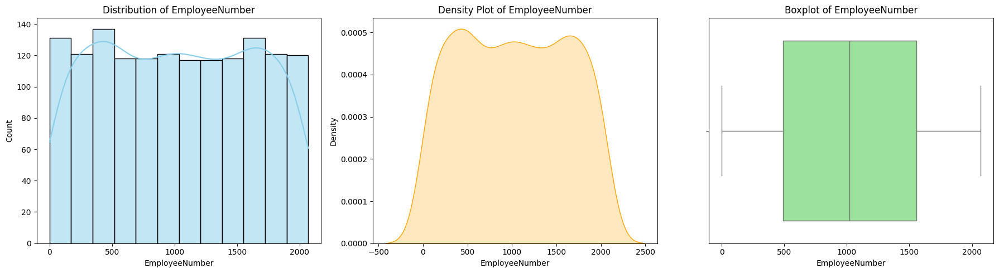


EnvironmentSatisfaction - Summary Statistics:
count    1470.000000
mean        2.721769
std         1.093082
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: EnvironmentSatisfaction, dtype: float64


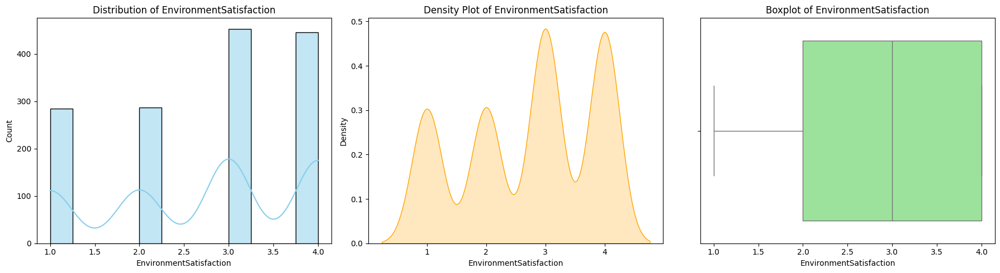


HourlyRate - Summary Statistics:
count    1470.000000
mean       65.891156
std        20.329428
min        30.000000
25%        48.000000
50%        66.000000
75%        83.750000
max       100.000000
Name: HourlyRate, dtype: float64


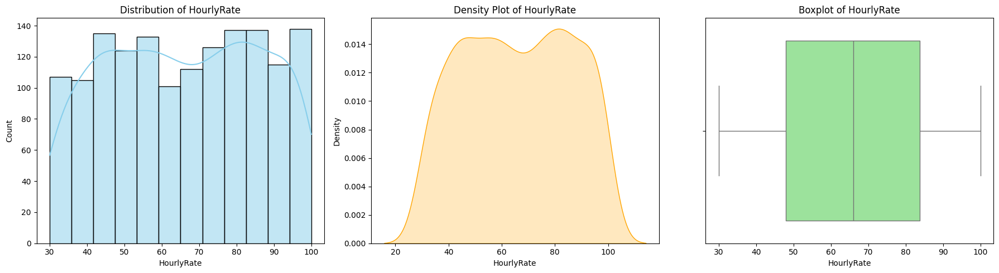


JobInvolvement - Summary Statistics:
count    1470.000000
mean        2.729932
std         0.711561
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: JobInvolvement, dtype: float64


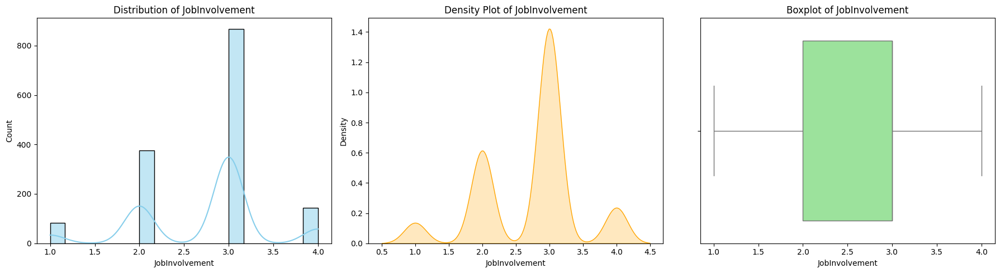


JobLevel - Summary Statistics:
count    1470.000000
mean        2.063946
std         1.106940
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         5.000000
Name: JobLevel, dtype: float64


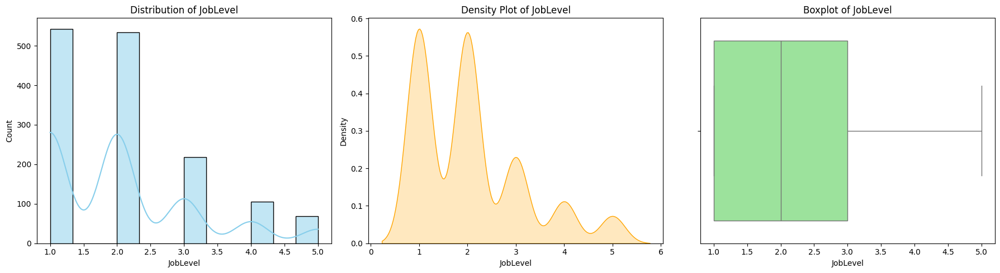


JobSatisfaction - Summary Statistics:
count    1470.000000
mean        2.728571
std         1.102846
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: JobSatisfaction, dtype: float64


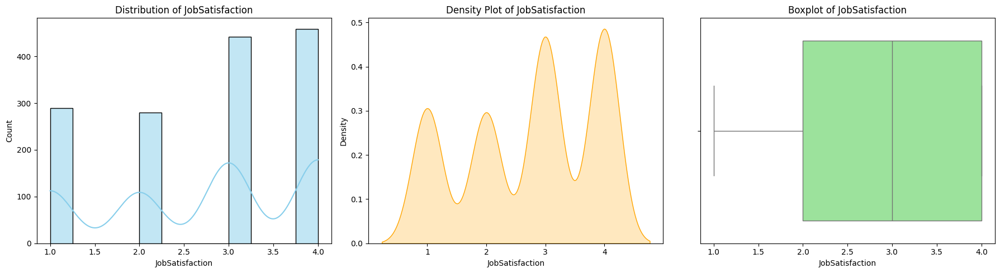


MonthlyIncome - Summary Statistics:
count     1470.000000
mean      6502.931293
std       4707.956783
min       1009.000000
25%       2911.000000
50%       4919.000000
75%       8379.000000
max      19999.000000
Name: MonthlyIncome, dtype: float64


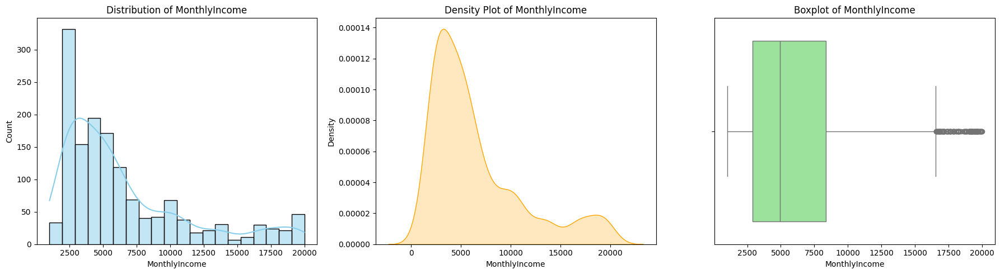


MonthlyRate - Summary Statistics:
count     1470.000000
mean     14313.103401
std       7117.786044
min       2094.000000
25%       8047.000000
50%      14235.500000
75%      20461.500000
max      26999.000000
Name: MonthlyRate, dtype: float64


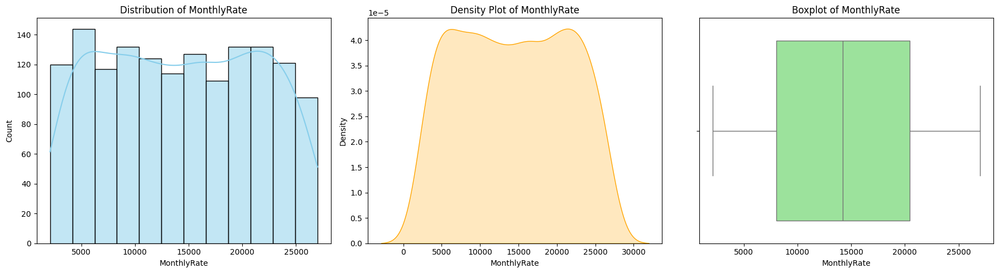


NumCompaniesWorked - Summary Statistics:
count    1470.000000
mean        2.693197
std         2.498009
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max         9.000000
Name: NumCompaniesWorked, dtype: float64


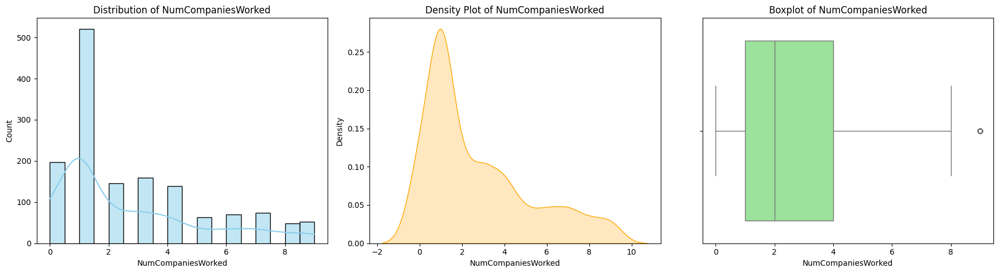


PercentSalaryHike - Summary Statistics:
count    1470.000000
mean       15.209524
std         3.659938
min        11.000000
25%        12.000000
50%        14.000000
75%        18.000000
max        25.000000
Name: PercentSalaryHike, dtype: float64


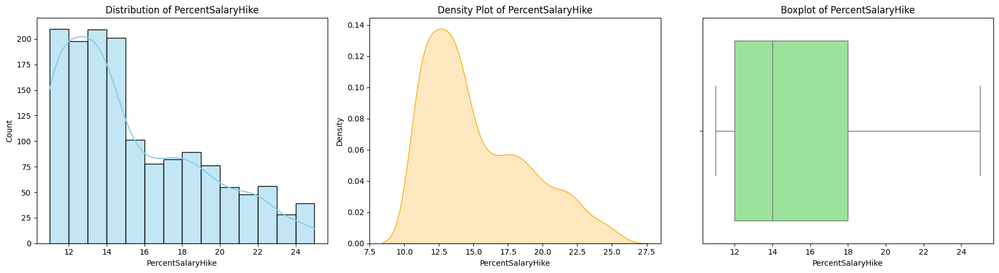


PerformanceRating - Summary Statistics:
count    1470.000000
mean        3.153741
std         0.360824
min         3.000000
25%         3.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: PerformanceRating, dtype: float64


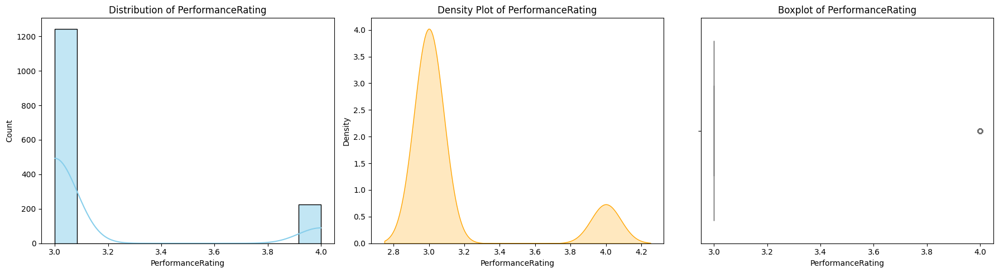


RelationshipSatisfaction - Summary Statistics:
count    1470.000000
mean        2.712245
std         1.081209
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: RelationshipSatisfaction, dtype: float64


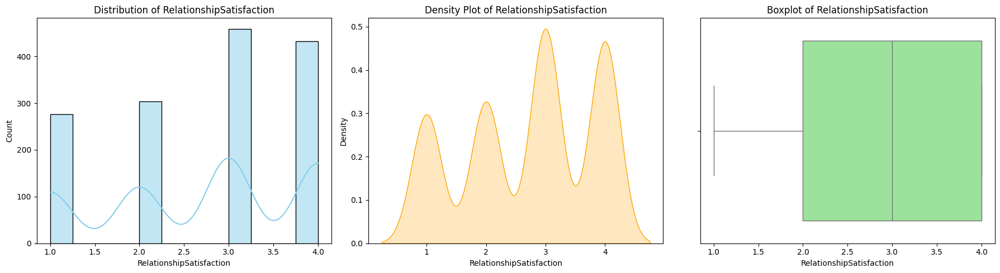


StandardHours - Summary Statistics:
count    1470.0
mean       80.0
std         0.0
min        80.0
25%        80.0
50%        80.0
75%        80.0
max        80.0
Name: StandardHours, dtype: float64


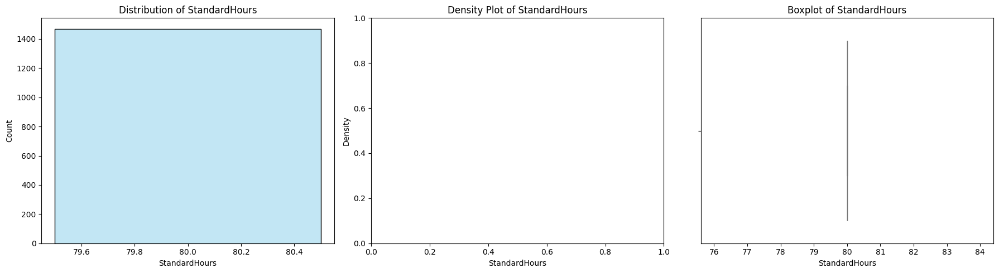


StockOptionLevel - Summary Statistics:
count    1470.000000
mean        0.793878
std         0.852077
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: StockOptionLevel, dtype: float64


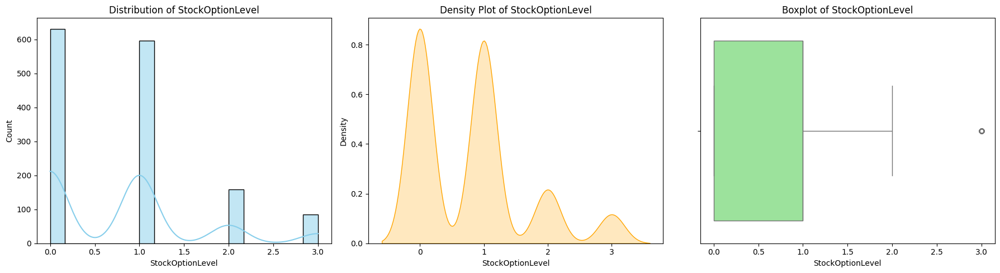


TotalWorkingYears - Summary Statistics:
count    1470.000000
mean       11.279592
std         7.780782
min         0.000000
25%         6.000000
50%        10.000000
75%        15.000000
max        40.000000
Name: TotalWorkingYears, dtype: float64


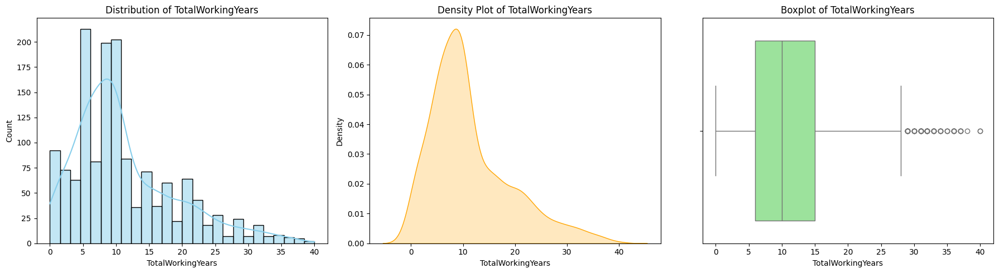


TrainingTimesLastYear - Summary Statistics:
count    1470.000000
mean        2.799320
std         1.289271
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         6.000000
Name: TrainingTimesLastYear, dtype: float64


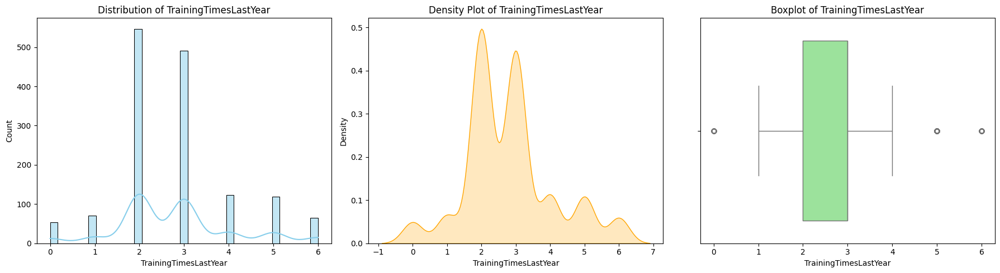


WorkLifeBalance - Summary Statistics:
count    1470.000000
mean        2.761224
std         0.706476
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: WorkLifeBalance, dtype: float64


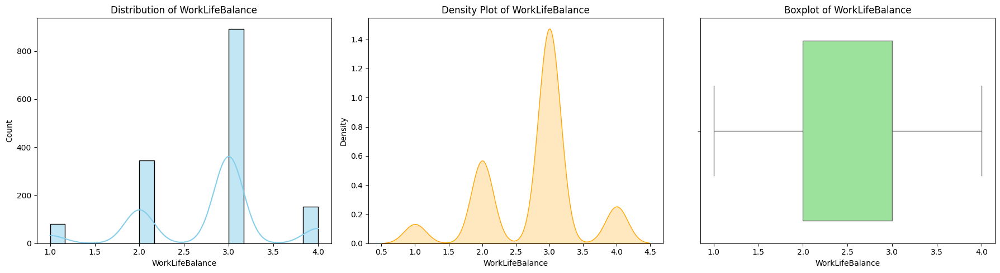


YearsAtCompany - Summary Statistics:
count    1470.000000
mean        7.008163
std         6.126525
min         0.000000
25%         3.000000
50%         5.000000
75%         9.000000
max        40.000000
Name: YearsAtCompany, dtype: float64


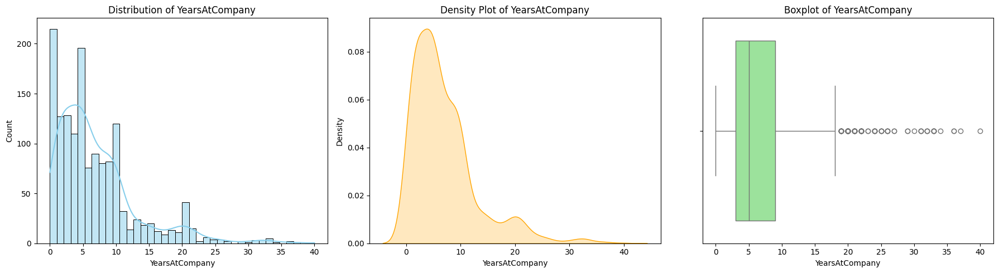


YearsInCurrentRole - Summary Statistics:
count    1470.000000
mean        4.229252
std         3.623137
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        18.000000
Name: YearsInCurrentRole, dtype: float64


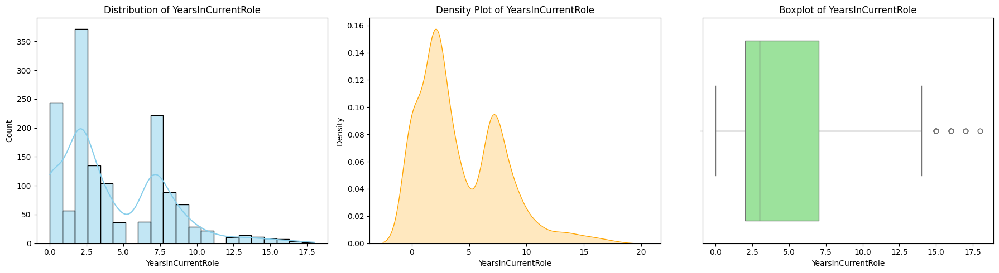


YearsSinceLastPromotion - Summary Statistics:
count    1470.000000
mean        2.187755
std         3.222430
min         0.000000
25%         0.000000
50%         1.000000
75%         3.000000
max        15.000000
Name: YearsSinceLastPromotion, dtype: float64


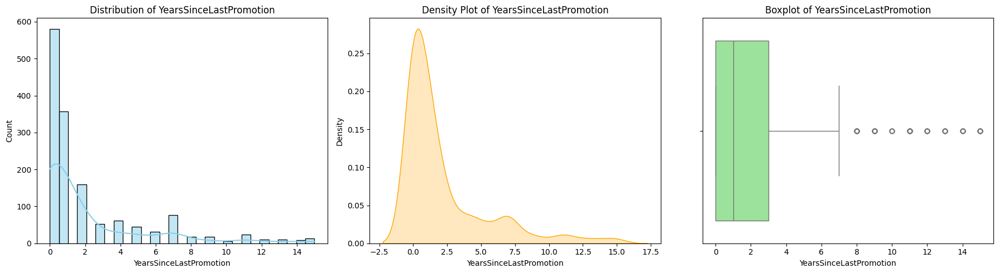


YearsWithCurrManager - Summary Statistics:
count    1470.000000
mean        4.123129
std         3.568136
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        17.000000
Name: YearsWithCurrManager, dtype: float64


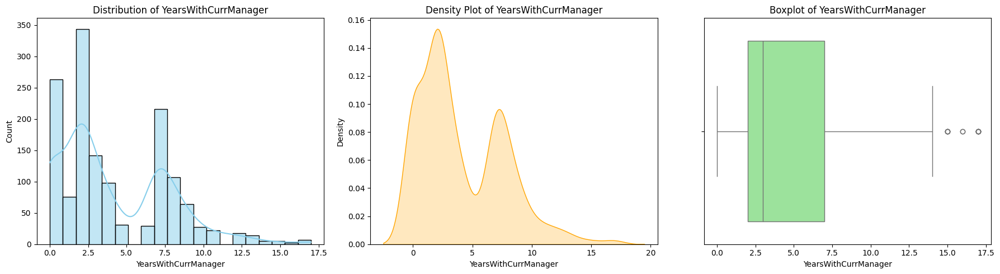

In [484]:
# EDA for Univariate Analysis - Numerical cols

# 1. Descriptive Statistics
print("Descriptive Statistics for Numeric Columns:")
print(data[numeric_cols].describe())

# 2. Distribution Visualization
plt.figure(figsize=(18, len(numeric_cols) * 5))

for index, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols), 3, index * 3 - 2)
    sns.histplot(data[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    plt.subplot(len(numeric_cols), 3, index * 3 - 1)
    sns.kdeplot(data[col], fill=True, color='orange')
    plt.title(f'Density Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')

    plt.subplot(len(numeric_cols), 3, index * 3)
    sns.boxplot(x=data[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

# 3. Summary Visualization
for col in numeric_cols:
    print(f"\n{col} - Summary Statistics:")
    print(data[col].describe())

    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    sns.histplot(data[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')

    plt.subplot(1, 3, 2)
    sns.kdeplot(data[col], fill=True, color='orange')
    plt.title(f'Density Plot of {col}')

    plt.subplot(1, 3, 3)
    sns.boxplot(x=data[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')

    plt.tight_layout()
    plt.show()

###3.3.2 EDA(UNIVARIATE - CATEGORICAL DATA)

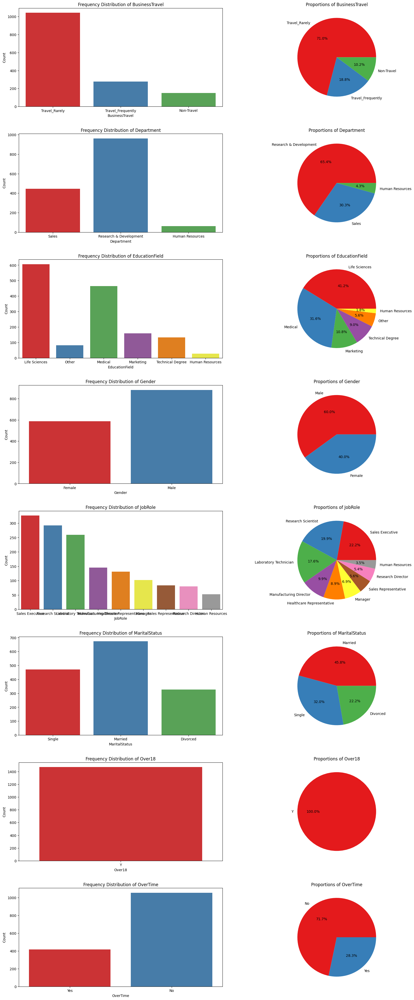


BusinessTravel - Frequency and Proportions:
                   Frequency  Proportion (%)
BusinessTravel                              
Travel_Rarely           1043       70.952381
Travel_Frequently        277       18.843537
Non-Travel               150       10.204082


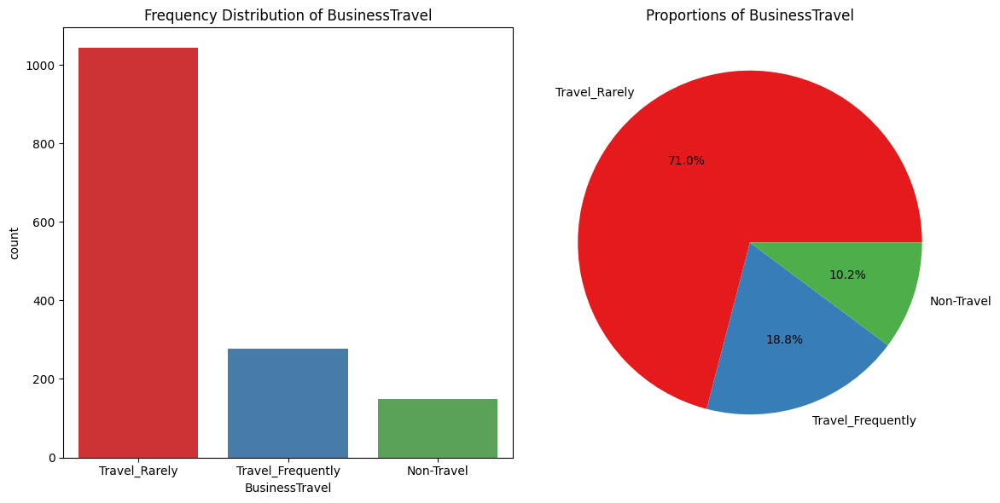


Department - Frequency and Proportions:
                        Frequency  Proportion (%)
Department                                       
Research & Development        961       65.374150
Sales                         446       30.340136
Human Resources                63        4.285714


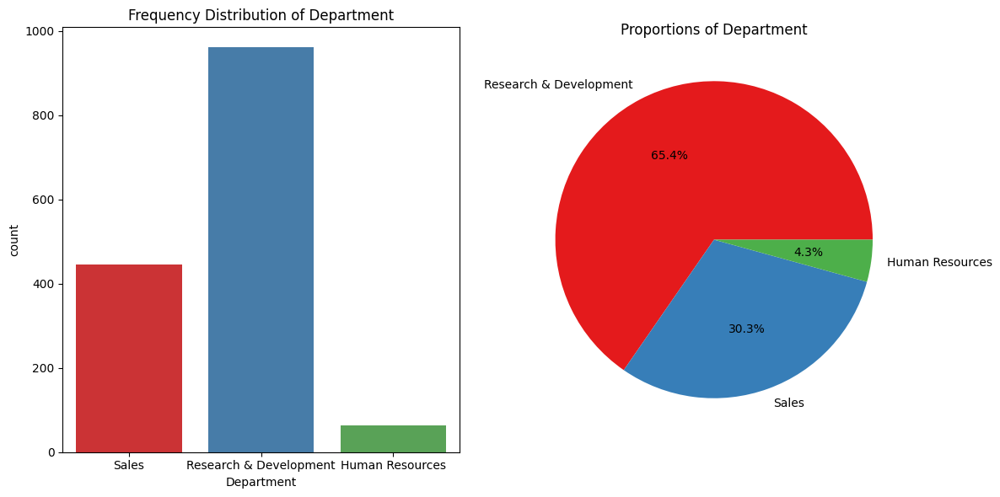


EducationField - Frequency and Proportions:
                  Frequency  Proportion (%)
EducationField                             
Life Sciences           606       41.224490
Medical                 464       31.564626
Marketing               159       10.816327
Technical Degree        132        8.979592
Other                    82        5.578231
Human Resources          27        1.836735


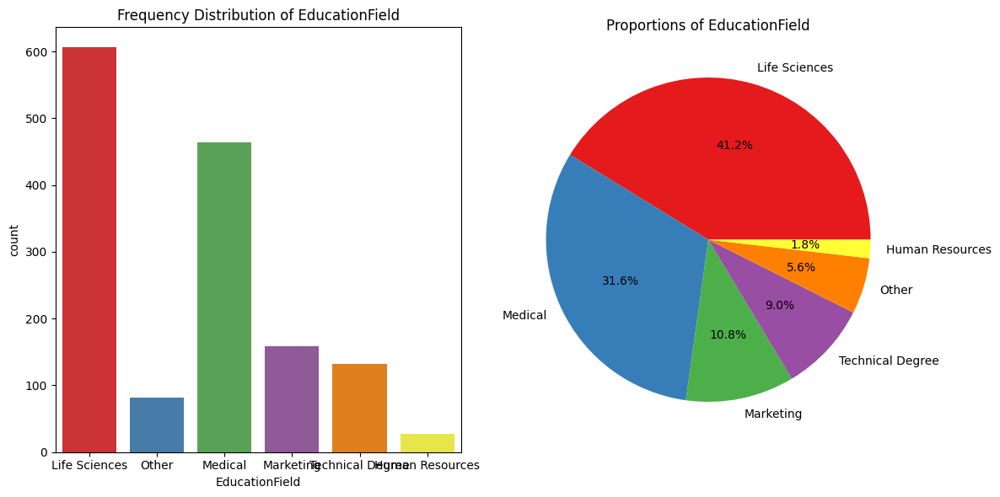


Gender - Frequency and Proportions:
        Frequency  Proportion (%)
Gender                           
Male          882            60.0
Female        588            40.0


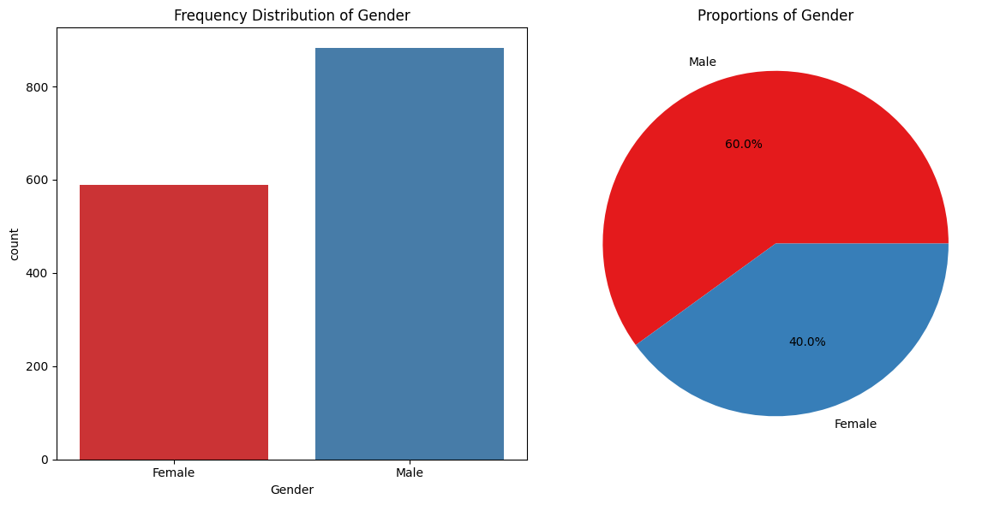


JobRole - Frequency and Proportions:
                           Frequency  Proportion (%)
JobRole                                             
Sales Executive                  326       22.176871
Research Scientist               292       19.863946
Laboratory Technician            259       17.619048
Manufacturing Director           145        9.863946
Healthcare Representative        131        8.911565
Manager                          102        6.938776
Sales Representative              83        5.646259
Research Director                 80        5.442177
Human Resources                   52        3.537415


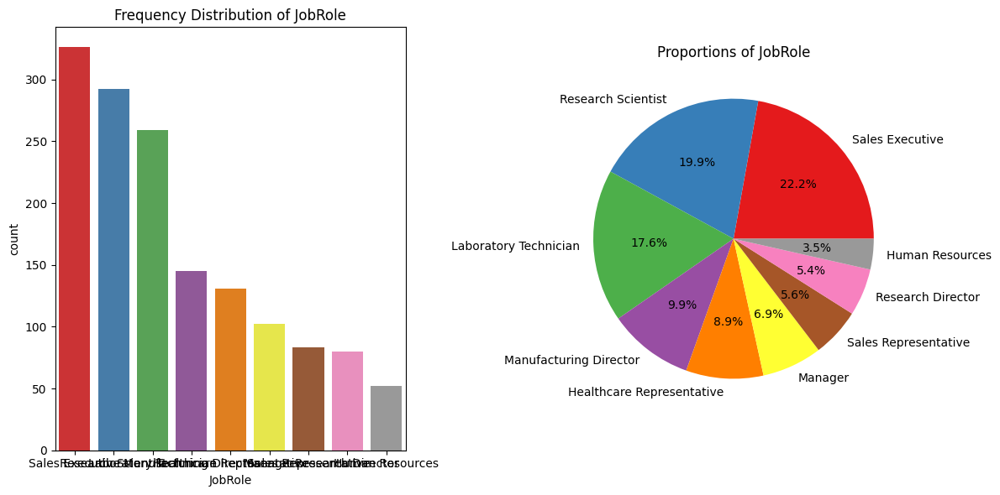


MaritalStatus - Frequency and Proportions:
               Frequency  Proportion (%)
MaritalStatus                           
Married              673       45.782313
Single               470       31.972789
Divorced             327       22.244898


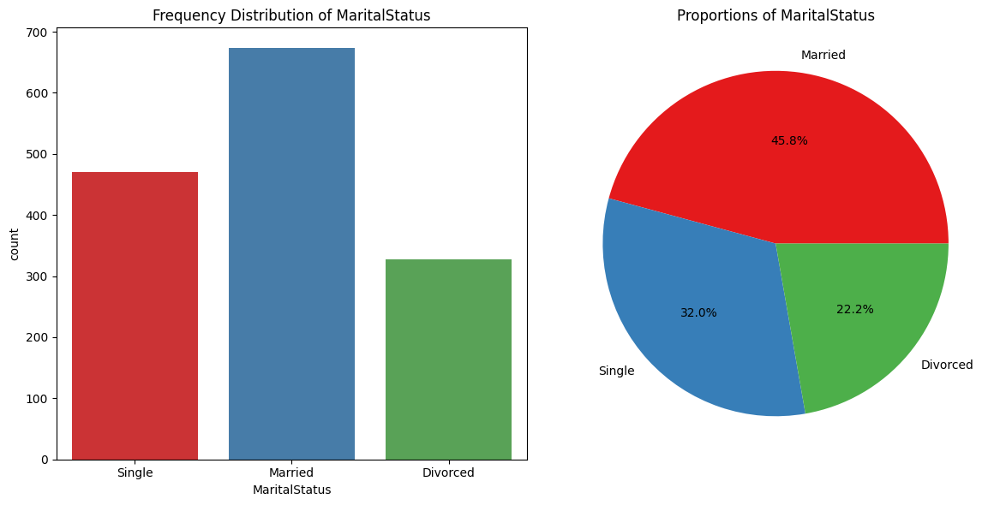


Over18 - Frequency and Proportions:
        Frequency  Proportion (%)
Over18                           
Y            1470           100.0


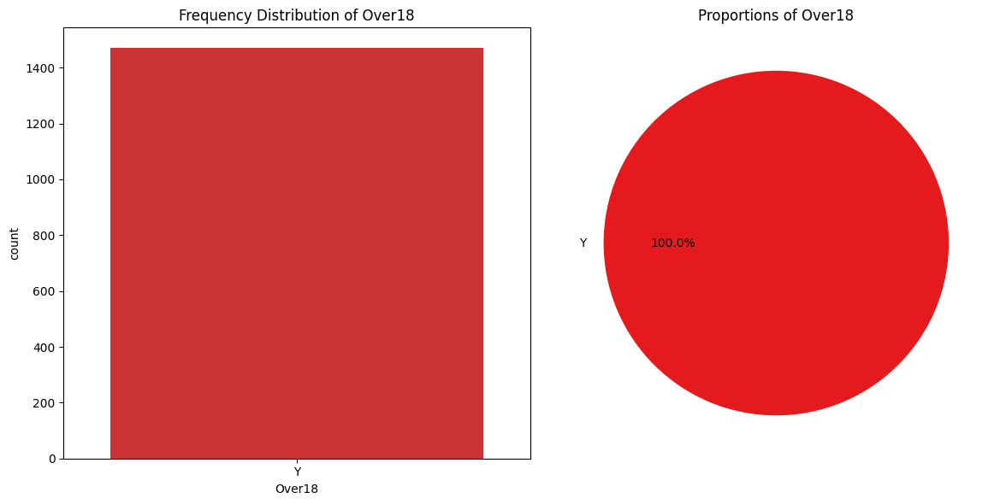


OverTime - Frequency and Proportions:
          Frequency  Proportion (%)
OverTime                           
No             1054        71.70068
Yes             416        28.29932


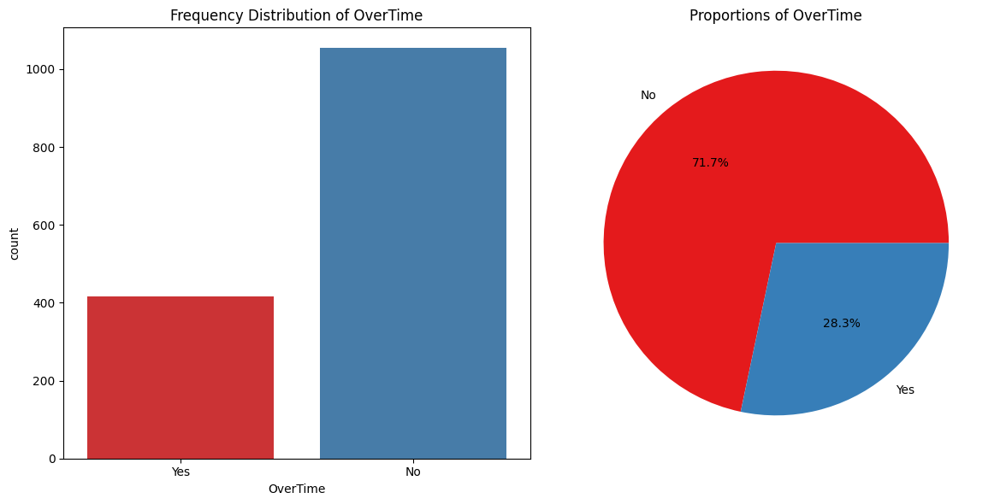

In [485]:
# EDA for Univariate Analysis - Categorical columns

# 1. Frequency Distribution and Proportion Analysis
plt.figure(figsize=(18, len(categorical_cols) * 5))

for index, col in enumerate(categorical_cols, 1):
    plt.subplot(len(categorical_cols), 2, index * 2 - 1)
    sns.countplot(x=data[col], palette='Set1')
    plt.title(f'Frequency Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')

    plt.subplot(len(categorical_cols), 2, index * 2)
    # Optional: Pie Chart for proportions
    counts = data[col].value_counts()
    proportions = counts / len(data) * 100
    plt.pie(proportions, labels=proportions.index, autopct='%1.1f%%', colors=sns.color_palette('Set1', len(proportions)))
    plt.title(f'Proportions of {col}')

plt.tight_layout(pad=3.0)
plt.show()

# 2. Summary Visualization
for col in categorical_cols:
    print(f"\n{col} - Frequency and Proportions:")
    freq_table = data[col].value_counts()
    prop_table = freq_table / len(data) * 100
    print(pd.DataFrame({'Frequency': freq_table, 'Proportion (%)': prop_table}))

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    sns.countplot(x=data[col], palette='Set1')
    plt.title(f'Frequency Distribution of {col}')

    plt.subplot(1, 2, 2)
    counts = data[col].value_counts()
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('Set1', len(counts)))
    plt.title(f'Proportions of {col}')

    plt.tight_layout()
    plt.show()

###3.3.3 EDA ( Bivariate Analysis - Numerical columns)

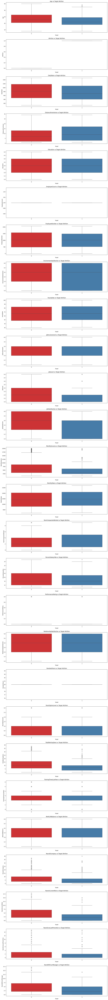

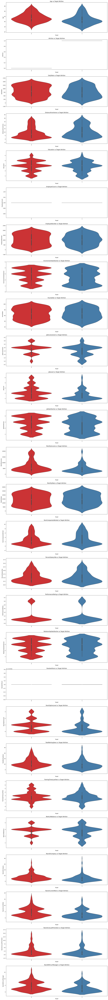

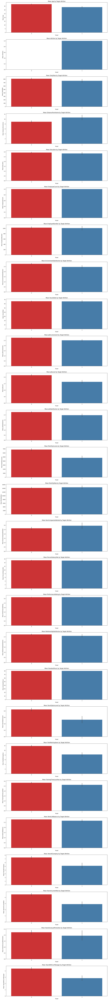

In [486]:
# EDA (Bivariate Analysis - Numerical columns)

# Numeric Features vs. Target Variable

# Box Plot
plt.figure(figsize=(15, len(numeric_cols) * 5))
for index, num_col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols), 1, index + 1)
    sns.boxplot(x=data[target_col], y=data[num_col], palette='Set1')
    plt.title(f'{num_col} vs Target {target_col}')
    plt.xlabel('Target')
    plt.ylabel(num_col)

plt.tight_layout(pad=2.0)
plt.show()

# Violin Plot
plt.figure(figsize=(15, len(numeric_cols) * 5))
for index, num_col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols), 1, index + 1)
    sns.violinplot(x=data[target_col], y=data[num_col], palette='Set1')
    plt.title(f'{num_col} vs Target {target_col}')
    plt.xlabel('Target')
    plt.ylabel(num_col)

plt.tight_layout(pad=2.0)
plt.show()

# Bar Plot with Aggregated Metrics (Mean)
plt.figure(figsize=(15, len(numeric_cols) * 5))
for index, num_col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols), 1, index + 1)
    sns.barplot(x=data[target_col], y=data[num_col], palette='Set1', estimator='mean')
    plt.title(f'Mean {num_col} by Target {target_col}')
    plt.xlabel('Target')
    plt.ylabel(f'Mean {num_col}')

plt.tight_layout(pad=2.0)
plt.show()

### 3.3.4 EDA(Bi-variate analysis of categorical data)

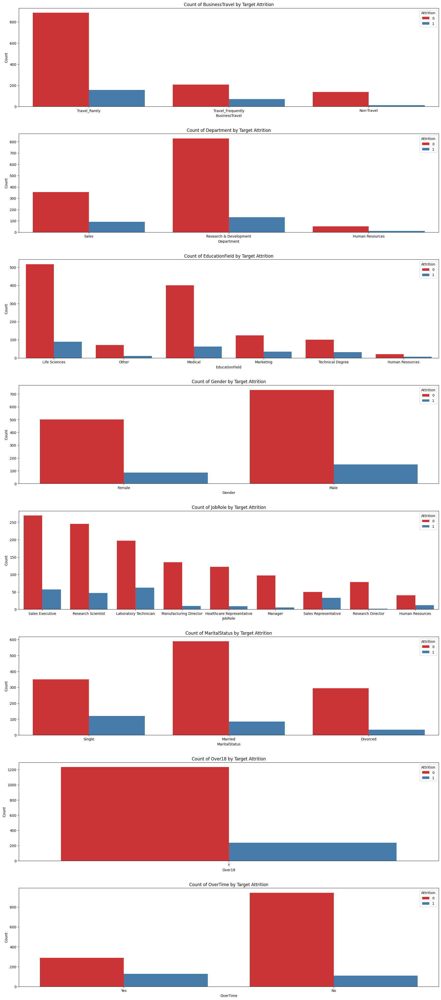

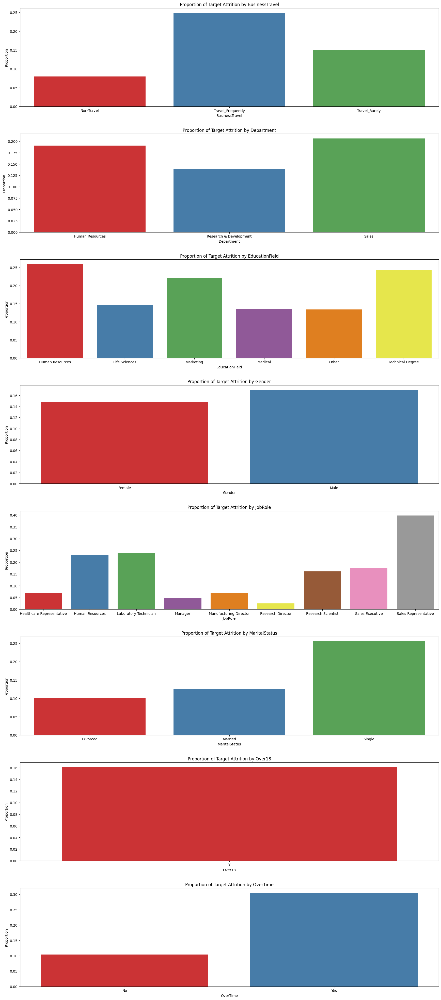

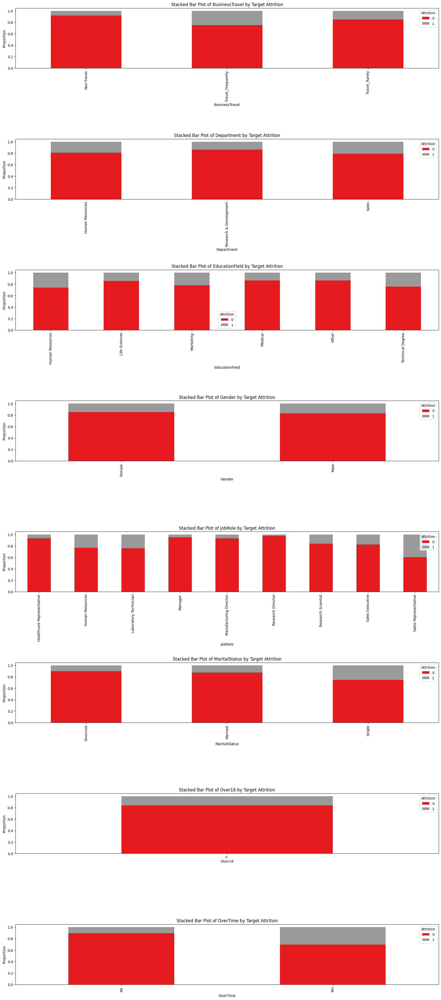

In [487]:
# Bi-variate analysis of categorical data
# Categorical Features vs. Target Variable

# Count Plot
plt.figure(figsize=(18, len(categorical_cols) * 5))
for index, cat_col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 1, index + 1)
    sns.countplot(x=data[cat_col], hue=data[target_col], palette='Set1')
    plt.title(f'Count of {cat_col} by Target {target_col}')
    plt.xlabel(cat_col)
    plt.ylabel('Count')

plt.tight_layout(pad=3.0)
plt.show()

# Bar Plot with Proportions
plt.figure(figsize=(18, len(categorical_cols) * 5))
for index, cat_col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 1, index + 1)
    # Calculate proportions for each category
    proportions = data.groupby(cat_col)[target_col].mean()
    sns.barplot(x=proportions.index, y=proportions.values, palette='Set1')
    plt.title(f'Proportion of Target {target_col} by {cat_col}')
    plt.xlabel(cat_col)
    plt.ylabel('Proportion')

plt.tight_layout(pad=3.0)
plt.show()

# Stacked Bar Plot (optional)
plt.figure(figsize=(18, len(categorical_cols) * 5))
for index, cat_col in enumerate(categorical_cols):
    plt.subplot(len(categorical_cols), 1, index + 1)
    # Calculate proportions for each category in each target class
    cross_tab = pd.crosstab(data[cat_col], data[target_col])
    cross_tab_norm = cross_tab.div(cross_tab.sum(1), axis=0)
    cross_tab_norm.plot(kind='bar', stacked=True, ax=plt.gca(), colormap='Set1')
    plt.title(f'Stacked Bar Plot of {cat_col} by Target {target_col}')
    plt.xlabel(cat_col)
    plt.ylabel('Proportion')

plt.tight_layout(pad=3.0)
plt.show()

###3.4 Hypothesis Testing

In [488]:
# hypothesis testing

#1. Hypothesis Testing
# Null Hypothesis: There is no relationship between independent variable and target
# Alternate Hypothesis : There is significant relationship between independent and dependent variable


In [489]:
# hypothesis testing categorical data

import pandas as pd
import scipy.stats as stats

def perform_categorical_hypothesis_testing(data, target_col, alpha=0.05):
    """
    Perform hypothesis testing for categorical columns with respect to the target variable.

    Parameters:
        data (pd.DataFrame): The dataset.
        target_col (str): The name of the target column.
        alpha (float): Significance level for hypothesis testing.

    Returns:
        significant_cols (list): List of significant categorical columns.
        insignificant_cols (list): List of insignificant categorical columns.
    """
    categorical_cols = data.select_dtypes(include=['object']).columns

    significant_cols = []
    insignificant_cols = []

    # Initialize results dictionary
    chi2_results = {}

    # Perform Chi-Square Test for categorical vs. target variable
    for cat_col in categorical_cols:
        if cat_col != target_col:
            contingency_table = pd.crosstab(data[cat_col], data[target_col])
            chi2_stat, p_val, _, _ = stats.chi2_contingency(contingency_table)
            chi2_results[cat_col] = p_val

            # Categorize columns based on p-value
            if p_val < alpha:
                significant_cols.append(cat_col)
            else:
                insignificant_cols.append(cat_col)

    return significant_cols, insignificant_cols

target_col = 'Attrition'
alpha = 0.05

significant_cols, insignificant_cols = perform_categorical_hypothesis_testing(data, target_col, alpha)

print("Significant Categorical Columns:")
print(significant_cols)

print("\nInsignificant Categorical Columns:")
print(insignificant_cols)


Significant Categorical Columns:
['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus', 'OverTime']

Insignificant Categorical Columns:
['Gender', 'Over18']


In [490]:
# hypothesis testing Numerical data

# Numeric vs. Target Variable

import pandas as pd
import scipy.stats as stats

def perform_numeric_hypothesis_testing(data, target_col, alpha=0.05):
    """
    Perform hypothesis testing for numeric columns with respect to the target variable.

    Parameters:
        data (pd.DataFrame): The dataset.
        target_col (str): The name of the target column.
        alpha (float): Significance level for hypothesis testing.

    Returns:
        significant_cols (list): List of significant numeric columns.
        insignificant_cols (list): List of insignificant numeric columns.
    """
    numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
    significant_cols = []
    insignificant_cols = []

    # Check if target column is numeric or categorical
    if data[target_col].dtype in ['int64', 'float64']:
        # Target is numeric
        for num_col in numeric_cols:
            if num_col != target_col:
                grouped_data = [data[data[target_col] == value][num_col] for value in data[target_col].unique()]
                if len(grouped_data) == 2:  # T-test for binary target
                    group1, group2 = grouped_data
                    t_stat, p_val = stats.ttest_ind(group1, group2)
                else:  # ANOVA for multi-class target
                    f_val, p_val = stats.f_oneway(*grouped_data)

                if p_val < alpha:
                    significant_cols.append(num_col)
                else:
                    insignificant_cols.append(num_col)
    else:
        # Target is categorical
        for num_col in numeric_cols:
            if num_col != target_col:
                group1 = data[data[target_col] == data[target_col].unique()[0]][num_col]
                group2 = data[data[target_col] == data[target_col].unique()[1]][num_col]
                if len(group1) > 0 and len(group2) > 0:
                    t_stat, p_val = stats.ttest_ind(group1, group2)
                    if p_val < alpha:
                        significant_cols.append(num_col)
                    else:
                        insignificant_cols.append(num_col)

    return significant_cols, insignificant_cols

target_col = 'Attrition'
alpha = 0.05

significant_cols, insignificant_cols = perform_numeric_hypothesis_testing(data, target_col, alpha)

print("Significant Numeric Columns:")
print(significant_cols,len(significant_cols))

print("\nInsignificant Numeric Columns:")
print(insignificant_cols,len(insignificant_cols))

Significant Numeric Columns:
['Age', 'DailyRate', 'DistanceFromHome', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager'] 15

Insignificant Numeric Columns:
['Education', 'EmployeeCount', 'EmployeeNumber', 'HourlyRate', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'YearsSinceLastPromotion'] 11


###3.5 Missing data analysis

Missing Data Summary:
Empty DataFrame
Columns: [Missing Values, Percentage]
Index: []


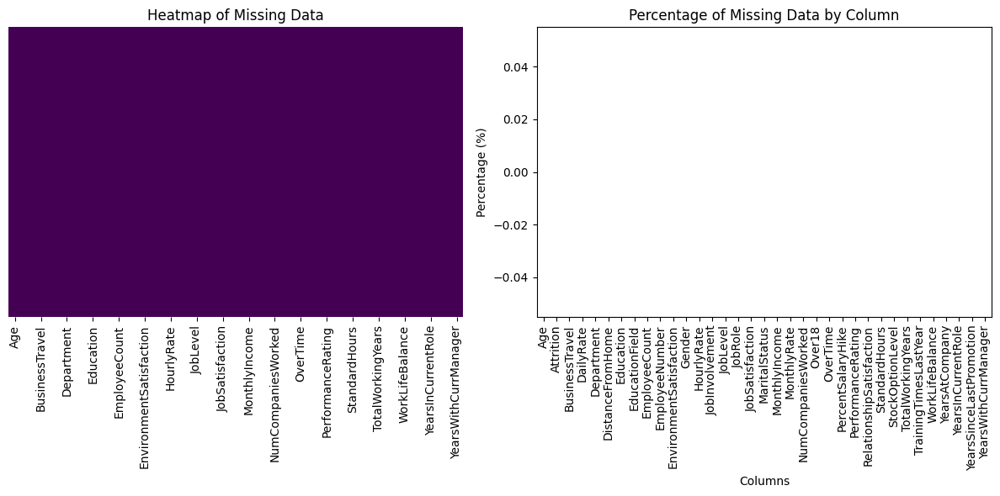

In [491]:
# Missing data analysis

def analyze_missing_data(data):
    """
    Analyze missing data in the dataset.

    Parameters:
        data (pd.DataFrame): The dataset.

    Returns:
        None
    """
    # 1. Identify Missing Data
    missing_counts = data.isnull().sum()
    missing_percentages = (data.isnull().sum() / len(data)) * 100

    # Create a DataFrame for better visualization
    missing_data_summary = pd.DataFrame({
        'Missing Values': missing_counts,
        'Percentage': missing_percentages
    })

    # Display the summary
    print("Missing Data Summary:")
    print(missing_data_summary[missing_data_summary['Missing Values'] > 0].sort_values(by='Percentage', ascending=False))

    # 2. Visualize Missing Data
    plt.figure(figsize=(12, 6))

    # Heatmap for missing values
    plt.subplot(1, 2, 1)
    sns.heatmap(data.isnull(), cbar=False, cmap='viridis', yticklabels=False)
    plt.title('Heatmap of Missing Data')

    # Bar plot for missing values percentage
    plt.subplot(1, 2, 2)
    missing_data_summary['Percentage'].plot(kind='bar', color='skyblue')
    plt.title('Percentage of Missing Data by Column')
    plt.xlabel('Columns')
    plt.ylabel('Percentage (%)')
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()


analyze_missing_data(data)

###3.6 Outlier Analysis


Column: Age
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


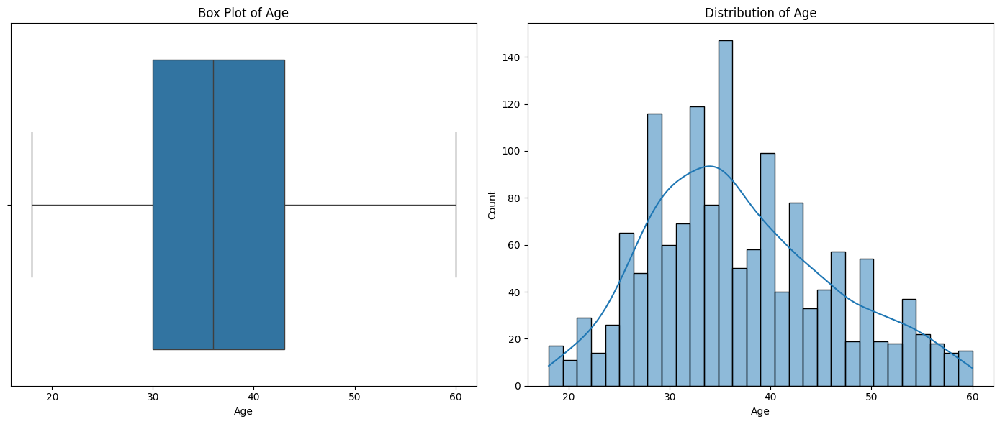


Column: Attrition
Number of outliers using Z-Score: 0
Number of outliers using IQR: 237


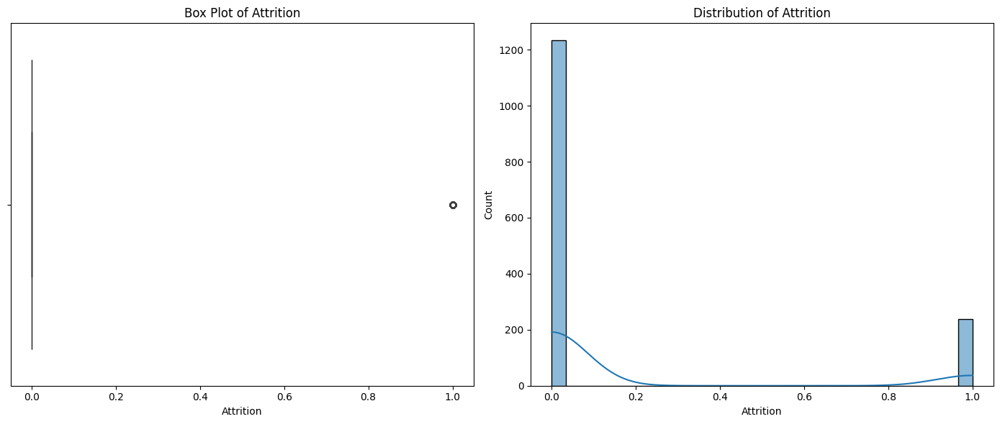


Column: DailyRate
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


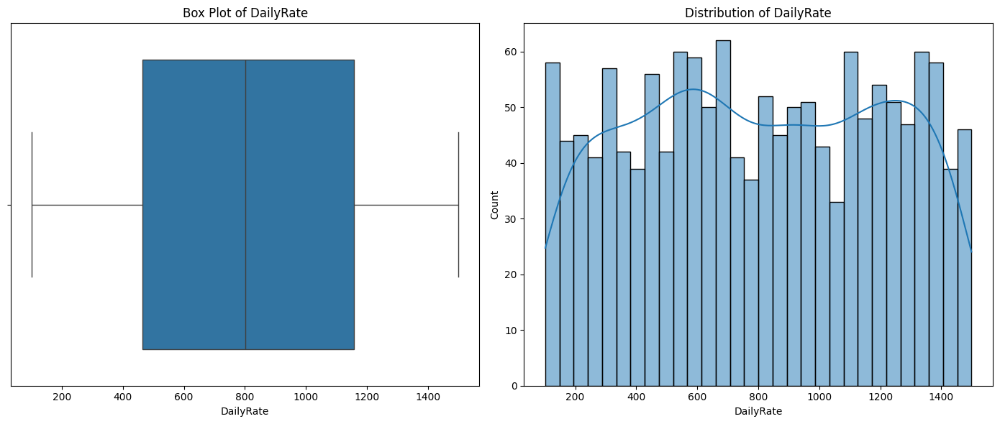


Column: DistanceFromHome
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


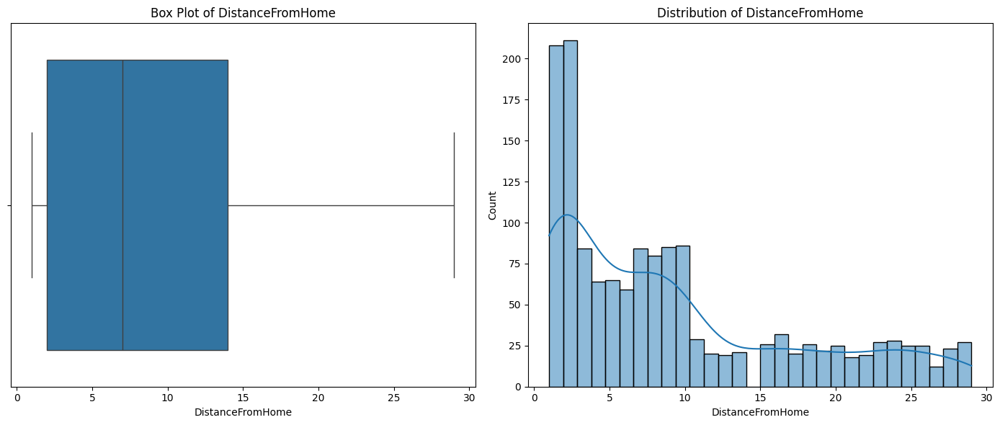


Column: Education
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


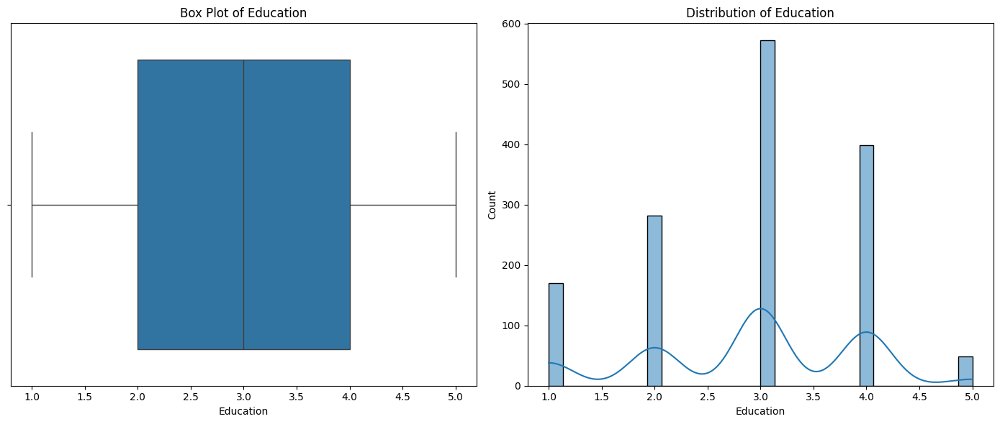


Column: EmployeeCount
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


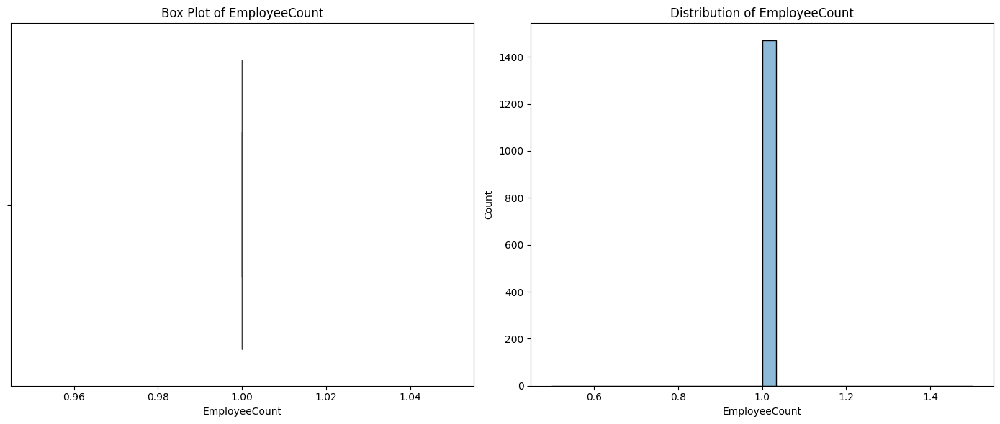


Column: EmployeeNumber
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


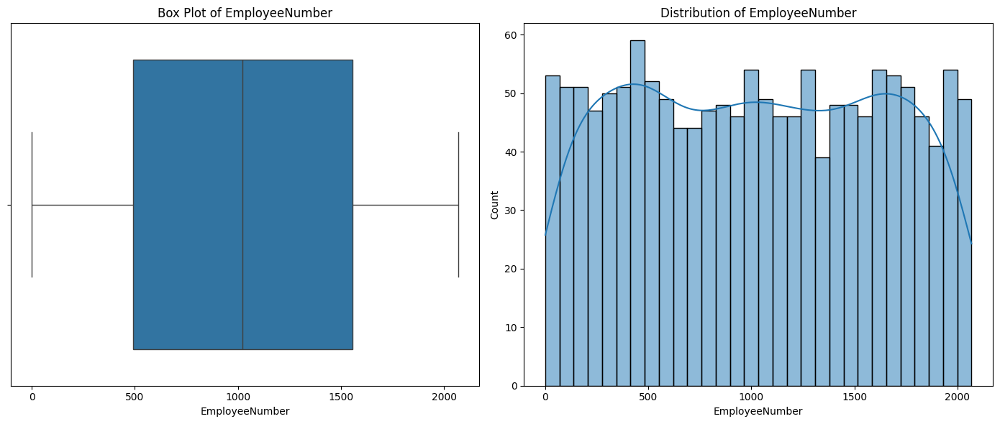


Column: EnvironmentSatisfaction
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


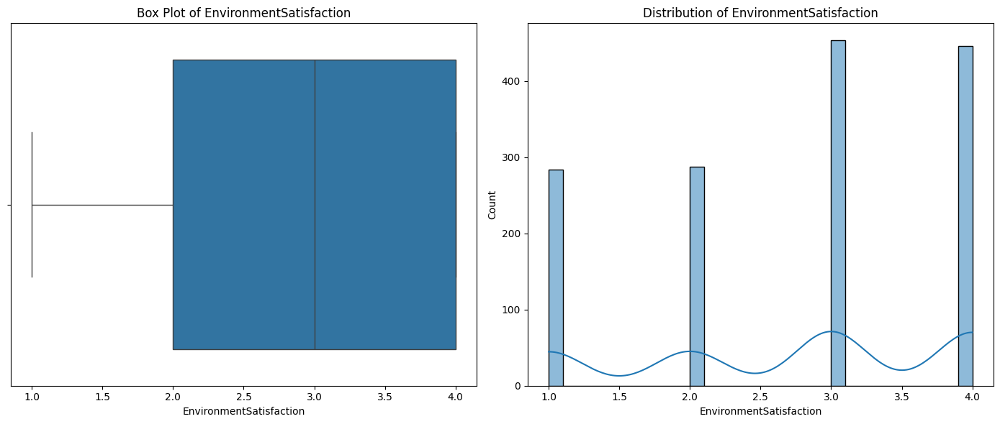


Column: HourlyRate
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


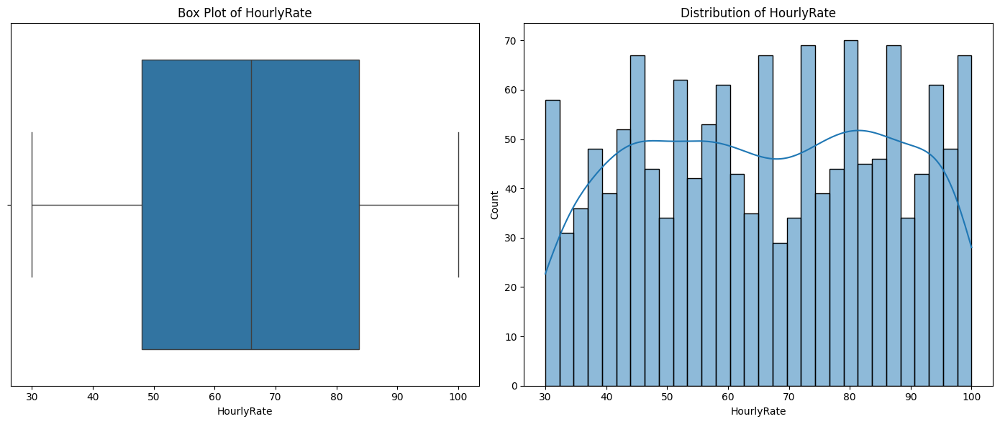


Column: JobInvolvement
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


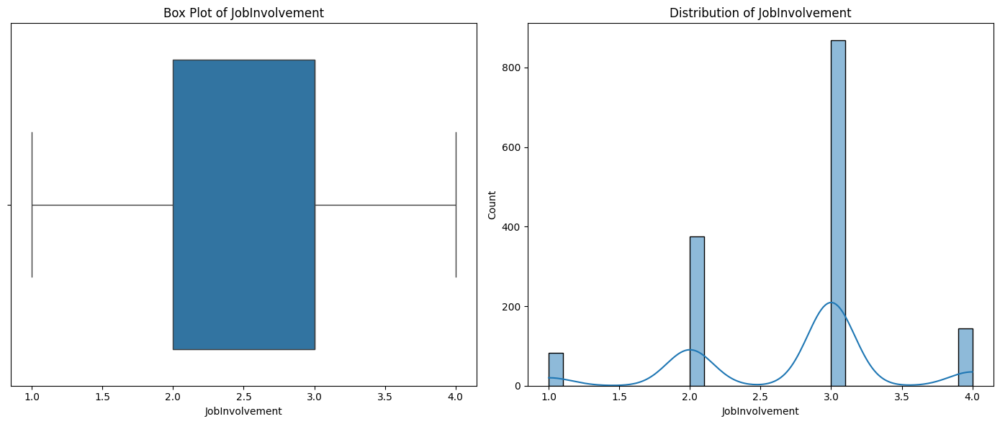


Column: JobLevel
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


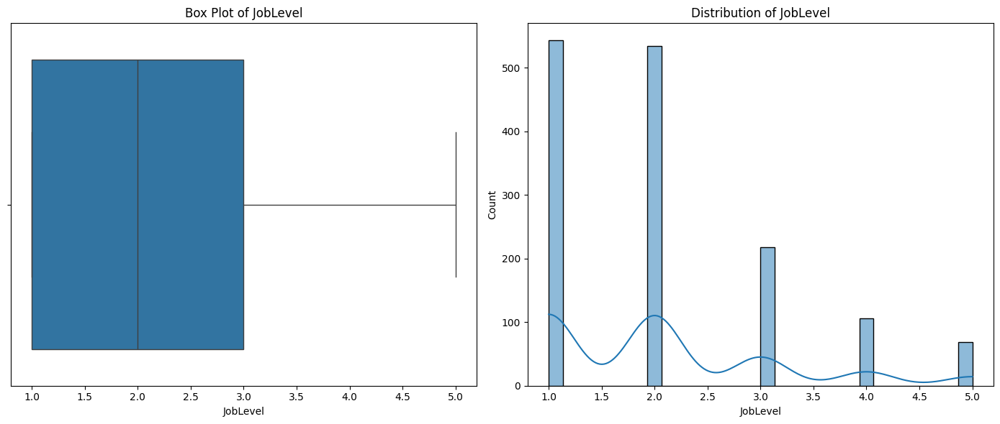


Column: JobSatisfaction
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


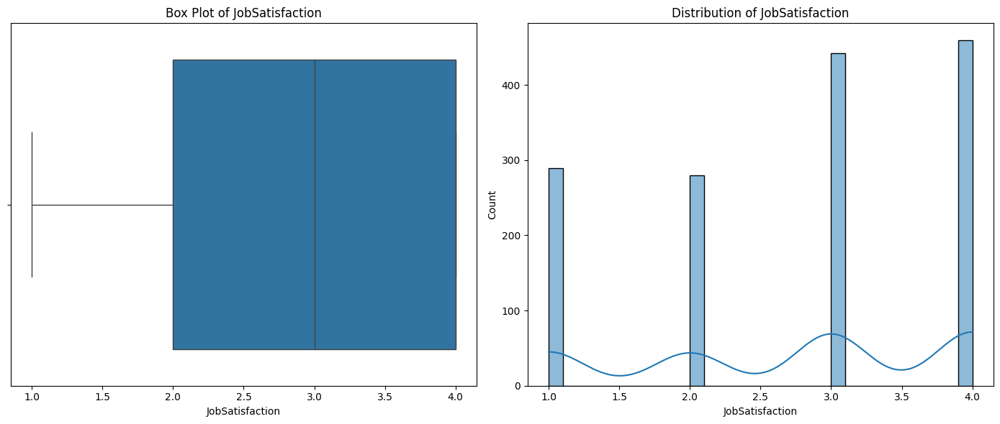


Column: MonthlyIncome
Number of outliers using Z-Score: 0
Number of outliers using IQR: 114


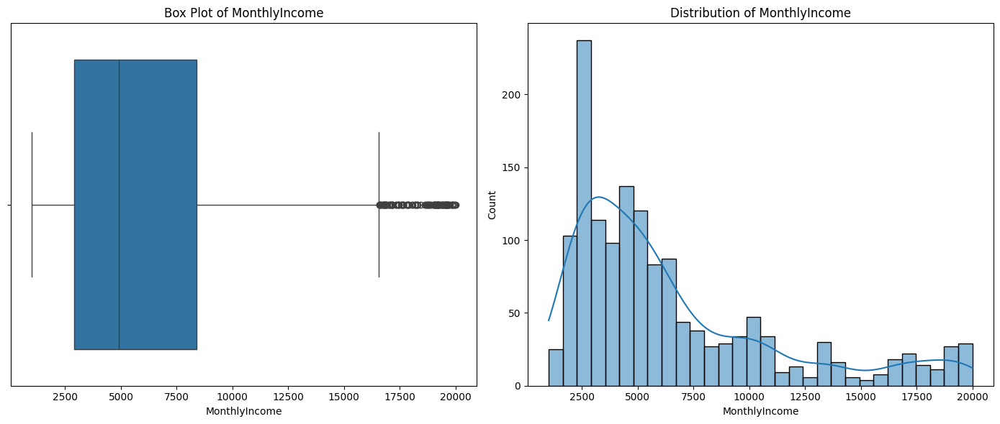


Column: MonthlyRate
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


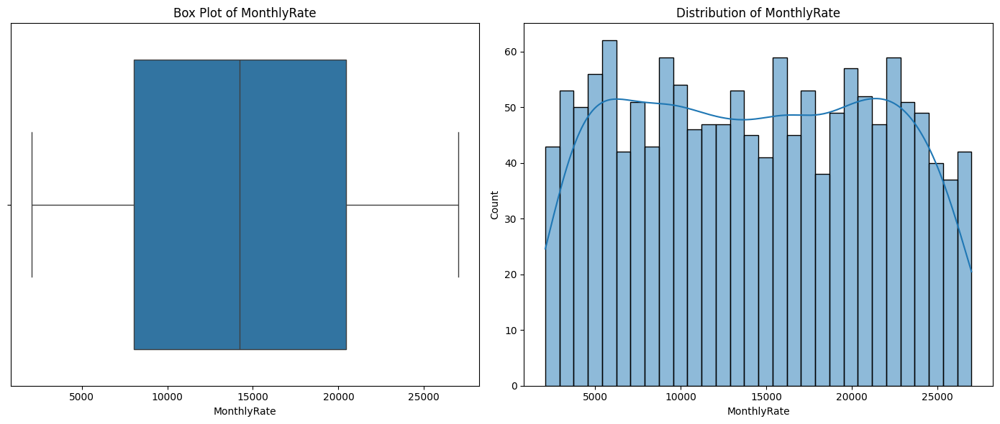


Column: NumCompaniesWorked
Number of outliers using Z-Score: 0
Number of outliers using IQR: 52


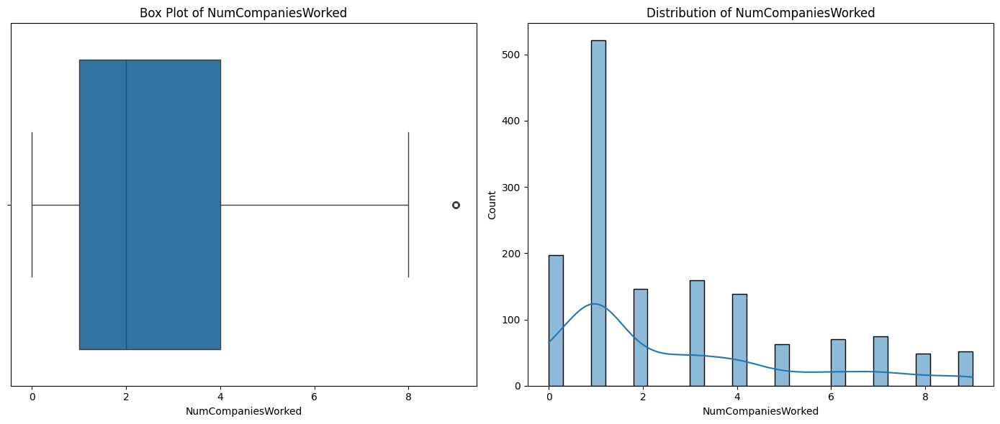


Column: PercentSalaryHike
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


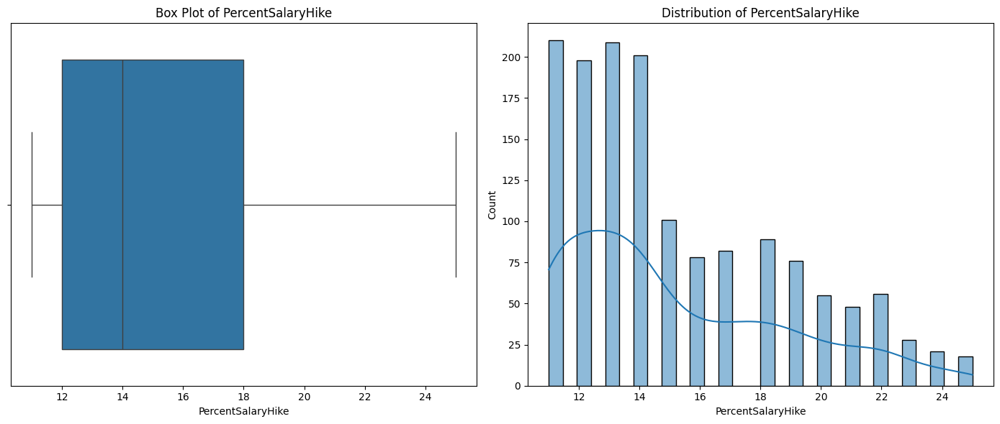


Column: PerformanceRating
Number of outliers using Z-Score: 0
Number of outliers using IQR: 226


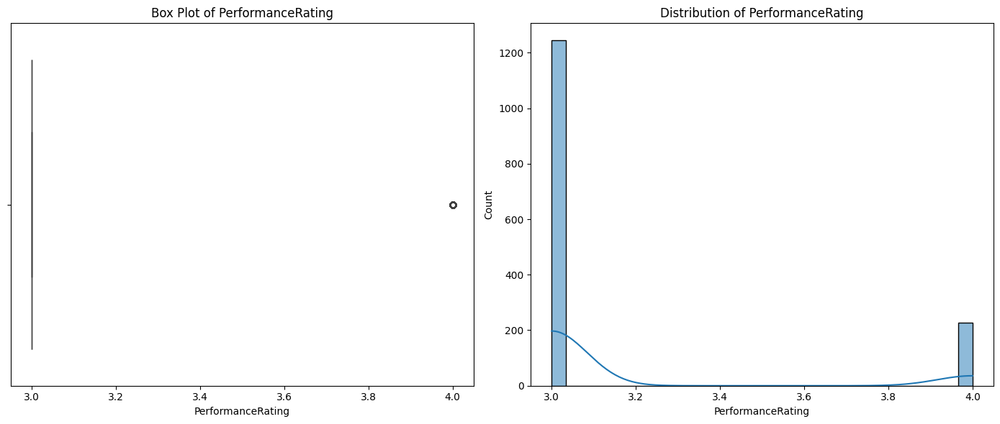


Column: RelationshipSatisfaction
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


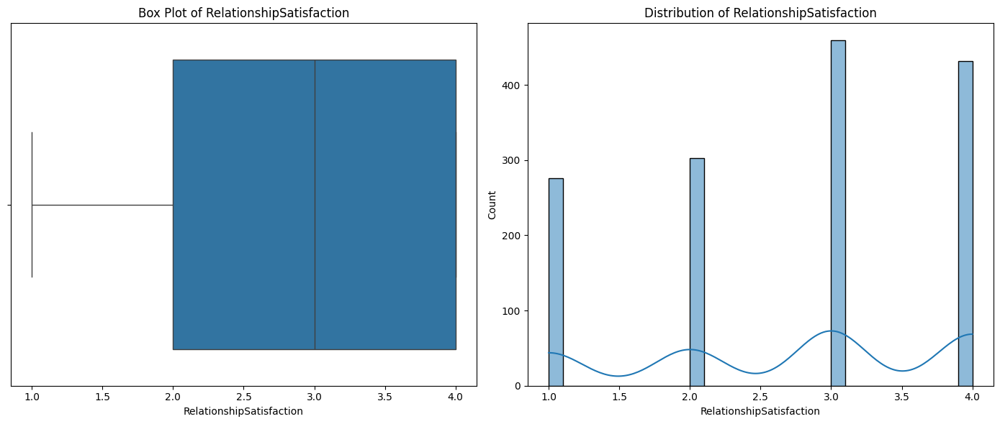


Column: StandardHours
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


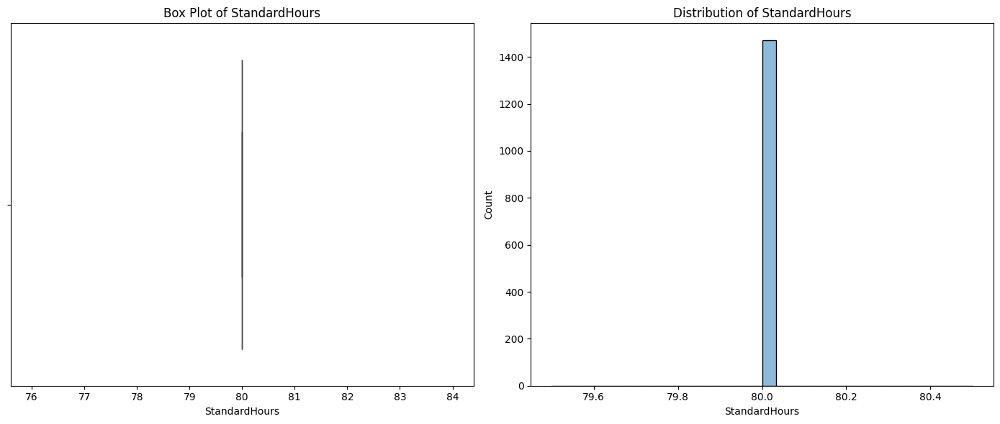


Column: StockOptionLevel
Number of outliers using Z-Score: 0
Number of outliers using IQR: 85


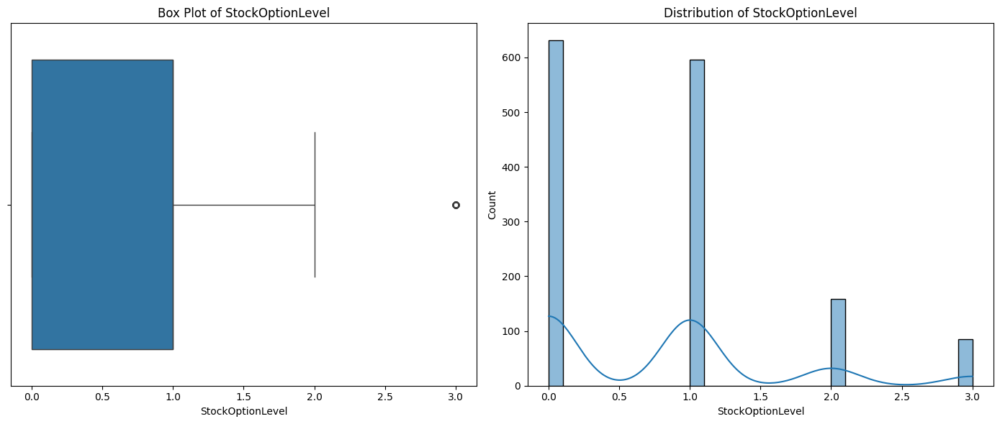


Column: TotalWorkingYears
Number of outliers using Z-Score: 16
Number of outliers using IQR: 63


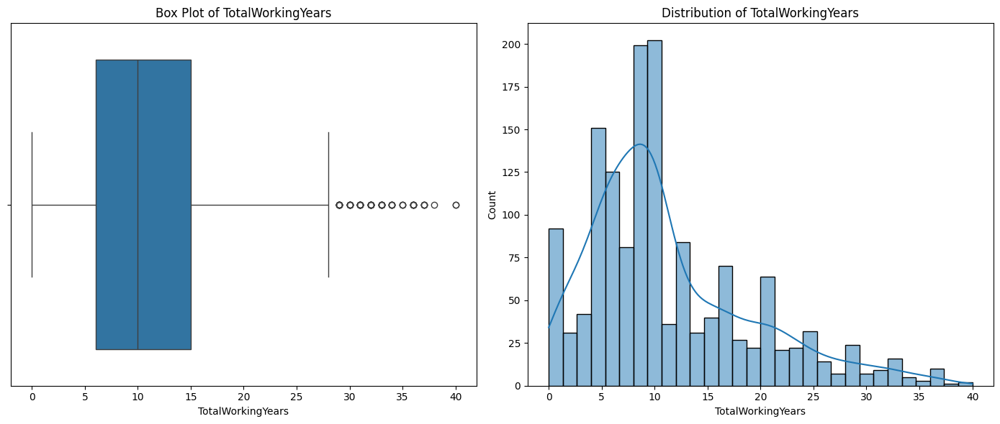


Column: TrainingTimesLastYear
Number of outliers using Z-Score: 0
Number of outliers using IQR: 238


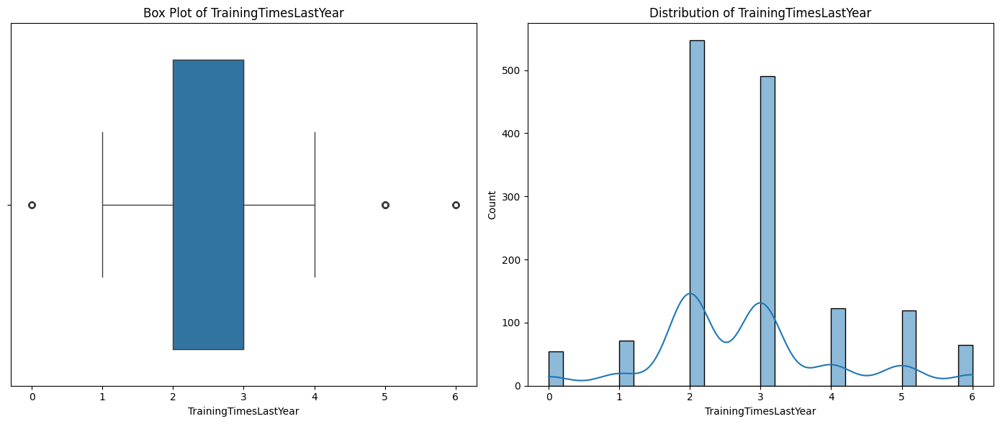


Column: WorkLifeBalance
Number of outliers using Z-Score: 0
Number of outliers using IQR: 0


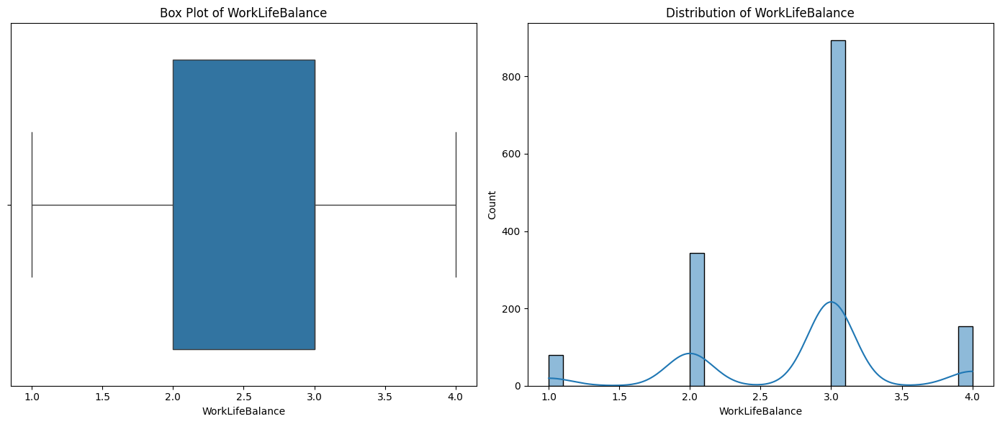


Column: YearsAtCompany
Number of outliers using Z-Score: 25
Number of outliers using IQR: 104


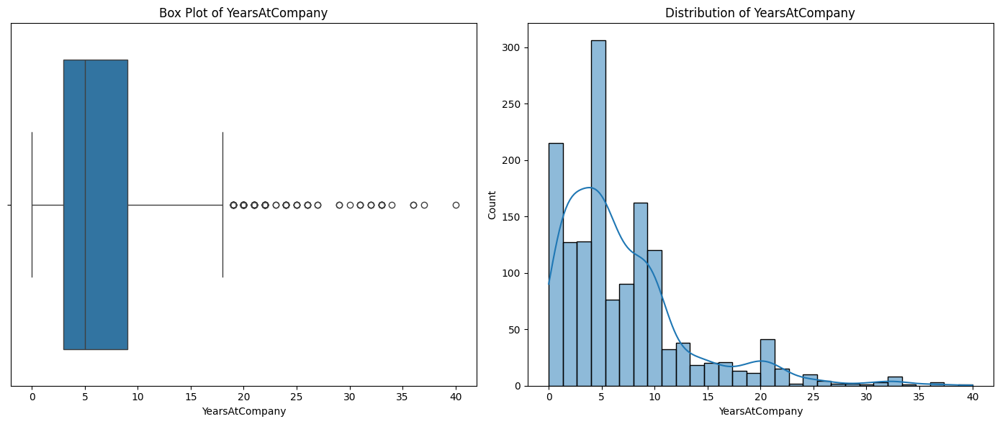


Column: YearsInCurrentRole
Number of outliers using Z-Score: 13
Number of outliers using IQR: 21


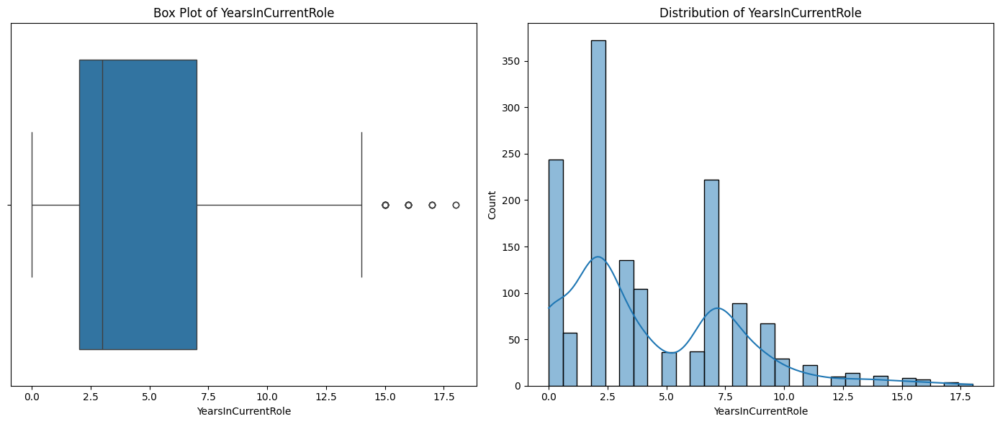


Column: YearsSinceLastPromotion
Number of outliers using Z-Score: 42
Number of outliers using IQR: 107


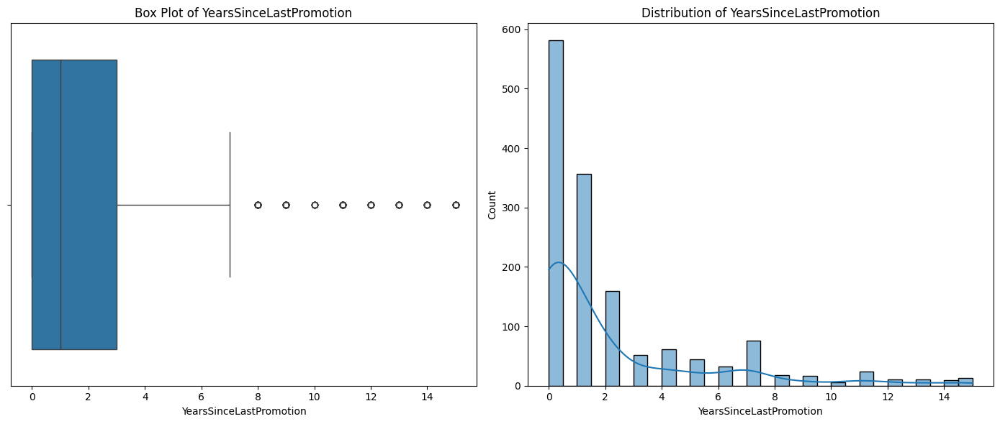


Column: YearsWithCurrManager
Number of outliers using Z-Score: 14
Number of outliers using IQR: 14


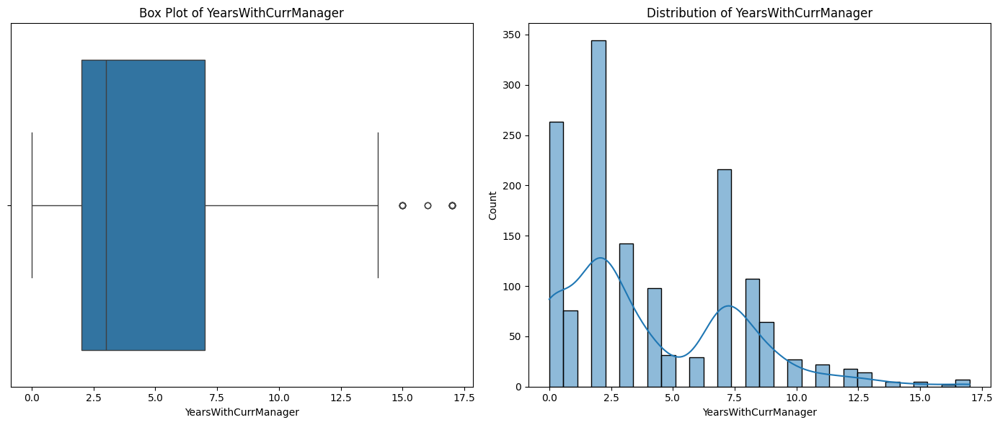

In [492]:
# Outliers data analysis for numerical cols

import seaborn as sns
import matplotlib.pyplot as plt

def analyze_outliers(data, numeric_cols):
    """
    Analyze outliers in the dataset for the specified numeric columns.

    Parameters:
        data (pd.DataFrame): The dataset.
        numeric_cols (list): List of numeric columns to analyze for outliers.

    Returns:
        None
    """
    for col in numeric_cols:
        if data[col].dtype in ['int64', 'float64']:
            # 1. Statistical Methods: Z-Score and IQR
            # Z-Score
            z_scores = np.abs((data[col] - data[col].mean()) / data[col].std())
            outliers_z = (z_scores > 3).sum()

            # IQR
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            outliers_iqr = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR))).sum()

            # Print outlier information
            print(f"\nColumn: {col}")
            print(f"Number of outliers using Z-Score: {outliers_z}")
            print(f"Number of outliers using IQR: {outliers_iqr}")

            # 2. Visualize Outliers
            plt.figure(figsize=(14, 6))

            # Box Plot
            plt.subplot(1, 2, 1)
            sns.boxplot(x=data[col])
            plt.title(f'Box Plot of {col}')

            # Distribution Plot
            plt.subplot(1, 2, 2)
            sns.histplot(data[col], kde=True, bins=30)
            plt.title(f'Distribution of {col}')

            plt.tight_layout()
            plt.show()


numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

analyze_outliers(data, numeric_cols)


Column: BusinessTravel
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


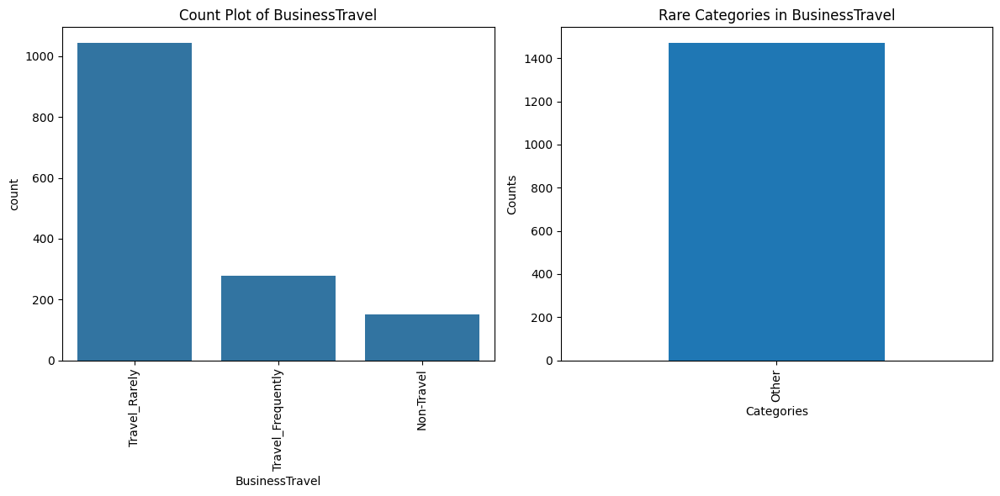


Column: Department
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


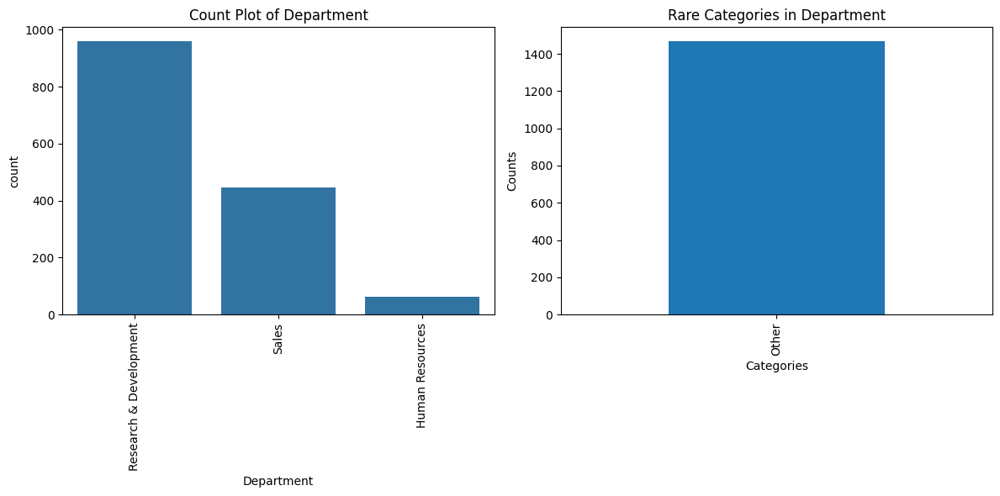


Column: EducationField
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


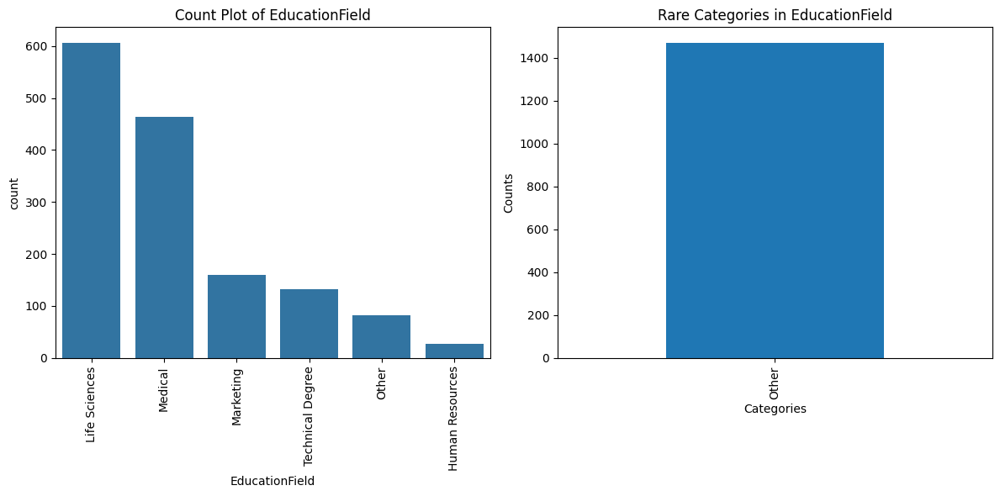


Column: Gender
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


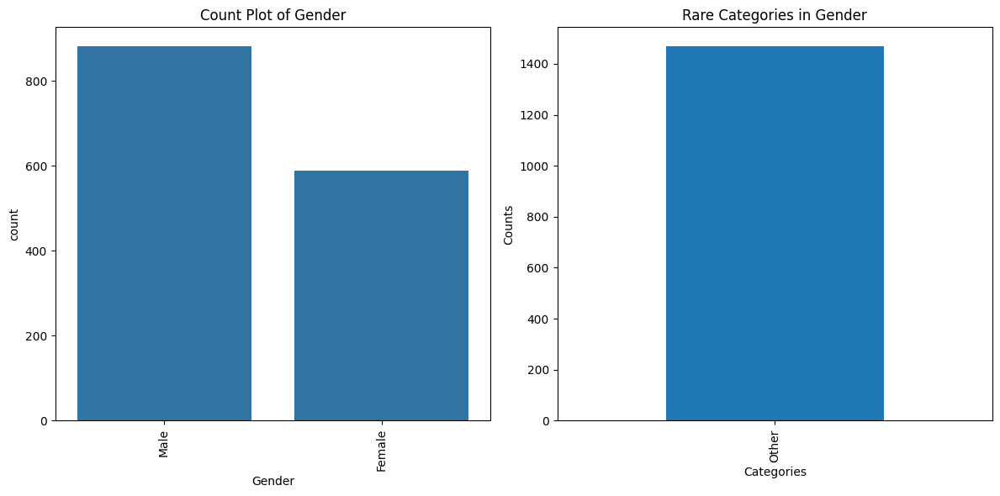


Column: JobRole
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


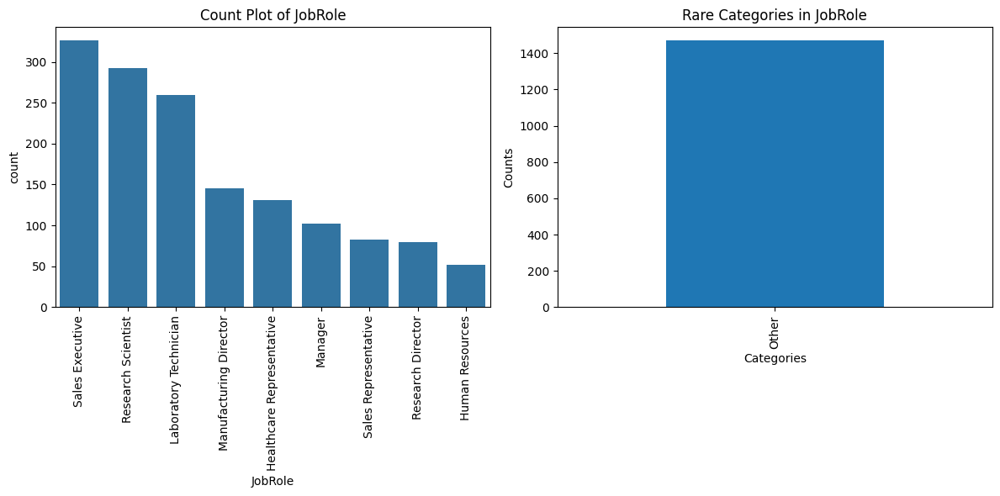


Column: MaritalStatus
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


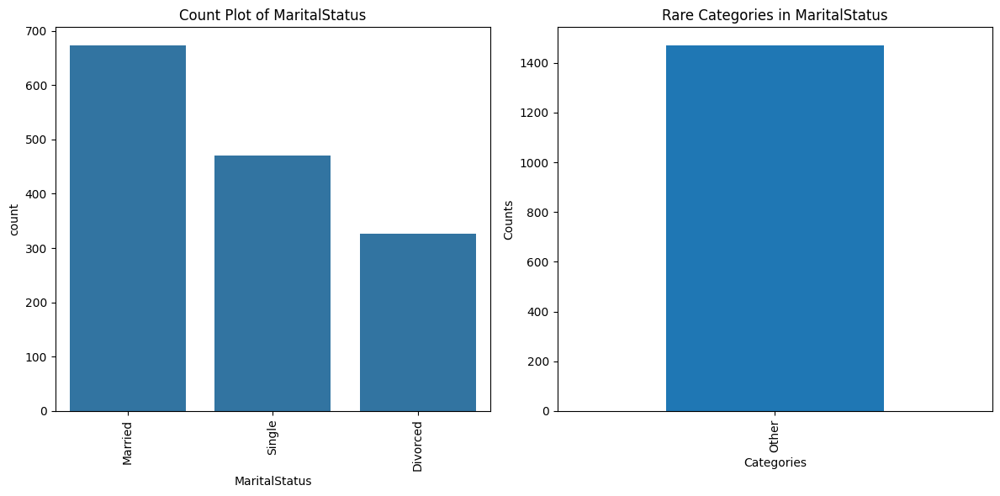


Column: Over18
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


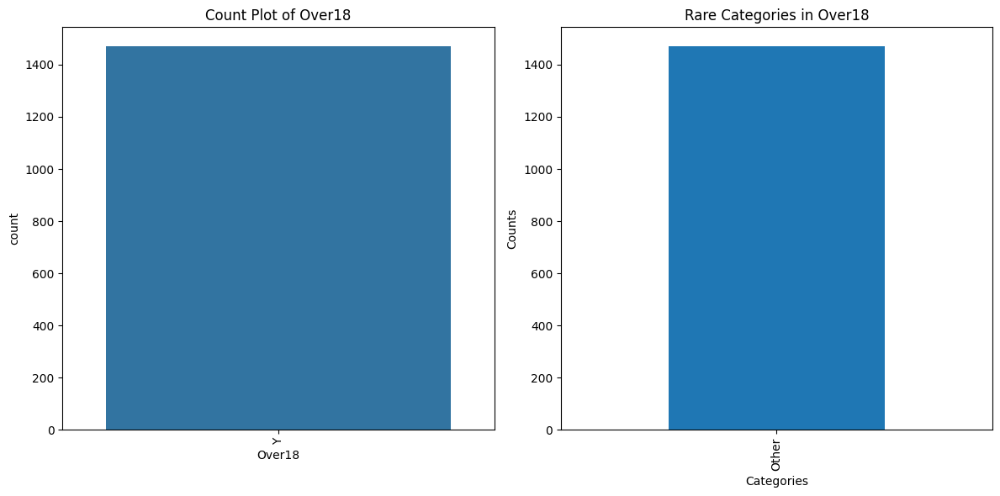


Column: OverTime
Categories considered rare (below 1.0% frequency):
Series([], Name: proportion, dtype: float64)


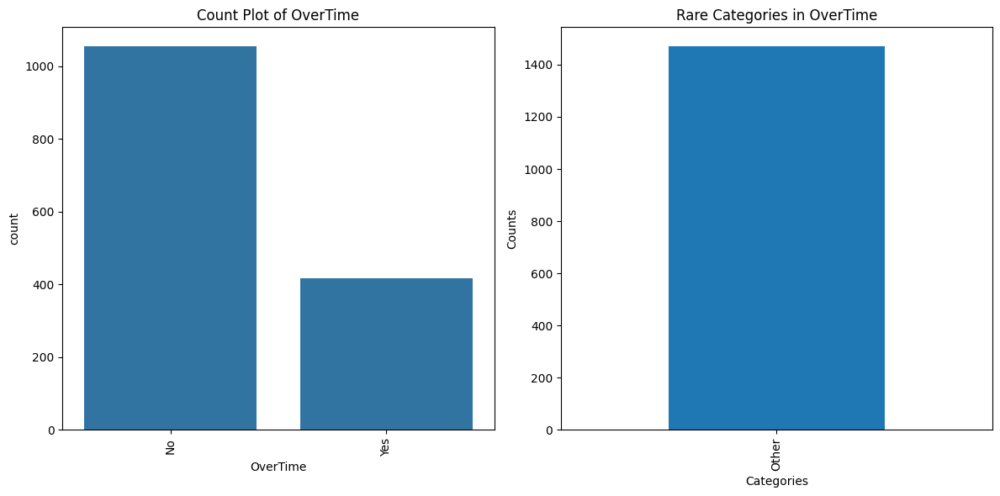

In [493]:
def analyze_categorical_outliers(data, categorical_cols, threshold=0.01):
    """
    Analyze rare categories (potential outliers) in categorical columns.

    Parameters:
        data (pd.DataFrame): The dataset.
        categorical_cols (list): List of categorical columns to analyze for rare categories.
        threshold (float): Frequency threshold for considering a category as rare (as a fraction of total observations).

    Returns:
        None
    """
    for col in categorical_cols:
        if data[col].dtype == 'object':
            # Calculate category frequencies
            freq = data[col].value_counts(normalize=True)
            rare_categories = freq[freq < threshold].index

            # Print rare categories information
            print(f"\nColumn: {col}")
            print(f"Categories considered rare (below {threshold*100}% frequency):")
            print(freq[freq < threshold])

            # Visualize rare categories
            plt.figure(figsize=(12, 6))

            # Bar Plot
            plt.subplot(1, 2, 1)
            sns.countplot(x=data[col], order=freq.index)
            plt.title(f'Count Plot of {col}')
            plt.xticks(rotation=90)

            # Plot rare categories separately
            plt.subplot(1, 2, 2)
            data[col].apply(lambda x: x if x in rare_categories else 'Other').value_counts().plot(kind='bar')
            plt.title(f'Rare Categories in {col}')
            plt.xlabel('Categories')
            plt.ylabel('Counts')
            plt.xticks(rotation=90)

            plt.tight_layout()
            plt.show()


categorical_cols = data.select_dtypes(include=['object']).columns

analyze_categorical_outliers(data, categorical_cols, threshold=0.01)

# 4. Feature Engineering

> train test split

> missing data treatment

> temporal variable treatment

> non-guassian distributed variables

> rare categorical labels treatment

> encoding categorical label

> feature scaling

###4.1 Train test split

In [494]:
# ->step 1 .train test split

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(data,data['Attrition'],random_state = 0,test_size = 0.2)
print(X_train.shape,X_test.shape)

target_col = 'Attrition'


(1176, 35) (294, 35)


In [495]:
y_test.unique()


array([0, 1])

###4.2 Missing data treatment

In [496]:

from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
def treat_missing_data(data):
    """
    Handle missing data in the dataset.

    Parameters:
        data (pd.DataFrame): The dataset.

    Returns:
        pd.DataFrame: The dataset with missing data treated.
    """
    # 1. Identify Missing Data
    missing_summary = data.isnull().sum()
    print("Missing Data Summary:")
    print(missing_summary[missing_summary > 0])

    # 2. Analyze the Impact
    # (Consider data distribution, potential impact on analysis, etc.)

    # 3. Choose Treatment Strategy
    # Drop columns with more than 50% missing values
    """
    threshold = 0.5
    cols_to_drop = missing_summary[missing_summary / len(data) > threshold].index
    data = data.drop(columns=cols_to_drop)
    """

    # Drop rows with missing target values
    if 'Attrition' in data.columns:
        data = data.dropna(subset=['Attrition'])

    # Impute missing values
    # Numeric columns: Impute with mean
    numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
    numeric_imputer = SimpleImputer(strategy='mean')
    data[numeric_cols] = numeric_imputer.fit_transform(data[numeric_cols])

    # Categorical columns: Impute with mode
    categorical_cols = data.select_dtypes(include=['object']).columns
    categorical_imputer = SimpleImputer(strategy='most_frequent')
    data[categorical_cols] = categorical_imputer.fit_transform(data[categorical_cols])

    # KNN Imputation (optional, for advanced cases)
    # knn_imputer = KNNImputer(n_neighbors=5)
    # data[numeric_cols] = knn_imputer.fit_transform(data[numeric_cols])



    # 4. Validate the Treatment
    # Print summary after treatment
    missing_summary_after = data.isnull().sum()
    print("\nMissing Data Summary After Treatment:")
    print(missing_summary_after[missing_summary_after > 0])

    return data


data_cleaned = treat_missing_data(X_train)


Missing Data Summary:
Series([], dtype: int64)

Missing Data Summary After Treatment:
Series([], dtype: int64)


###4.3 Outliers treatment

In [497]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

def treat_outliers(data, numeric_cols, categorical_cols, method_numeric='remove', method_categorical='group', threshold_numeric=3, rare_category_threshold=0.01):
    """
    Handle outliers in the dataset for both numeric and categorical columns.

    Parameters:
        data (pd.DataFrame): The dataset.
        numeric_cols (list): List of numeric columns to analyze for outliers.
        categorical_cols (list): List of categorical columns to analyze for rare categories.
        method_numeric (str): Method for handling numeric outliers ('remove', 'cap', 'impute', 'transform').
        method_categorical (str): Method for handling categorical outliers ('group', 'remove').
        threshold_numeric (float): Threshold for identifying numeric outliers (e.g., z-score).
        rare_category_threshold (float): Frequency threshold for considering a category as rare.

    Returns:
        pd.DataFrame: The dataset with outliers treated.
    """
    # Handle Numeric Outliers
    if method_numeric == 'remove':
        for col in numeric_cols:
            if data[col].dtype in ['int64', 'float64']:
                # Z-Score Method
                z_scores = np.abs(stats.zscore(data[col]))
                outliers = z_scores > threshold_numeric
                print(f"Number of outliers in column {col} using Z-Score: {outliers.sum()}")

                # Remove Outliers
                data = data[~outliers]

    elif method_numeric == 'cap':
        for col in numeric_cols:
            if data[col].dtype in ['int64', 'float64']:
                # Cap values at the 1st and 99th percentiles
                lower_limit = data[col].quantile(0.01)
                upper_limit = data[col].quantile(0.99)
                data[col] = np.clip(data[col], lower_limit, upper_limit)
                print(f"Column {col} capped at {lower_limit} and {upper_limit}")

    elif method_numeric == 'impute':
        for col in numeric_cols:
            if data[col].dtype in ['int64', 'float64']:
                # Impute outliers with median
                Q1 = data[col].quantile(0.25)
                Q3 = data[col].quantile(0.75)
                IQR = Q3 - Q1
                lower_bound = Q1 - 1.5 * IQR
                upper_bound = Q3 + 1.5 * IQR
                median = data[col].median()
                data[col] = np.where((data[col] < lower_bound) | (data[col] > upper_bound), median, data[col])
                print(f"Column {col} outliers imputed with median {median}")

    elif method_numeric == 'transform':
        for col in numeric_cols:
            if data[col].dtype in ['int64', 'float64']:
                # Apply log transformation
                data[col] = np.log1p(data[col])
                print(f"Log transformation applied to column {col}")

    # Handle Categorical Outliers
    if method_categorical == 'group':
        for col in categorical_cols:
            if data[col].dtype == 'object':
                # Calculate category frequencies
                freq = data[col].value_counts(normalize=True)
                rare_categories = freq[freq < rare_category_threshold].index
                data[col] = data[col].apply(lambda x: x if x not in rare_categories else 'Other')
                print(f"Rare categories grouped into 'Other' in column {col}")

    elif method_categorical == 'remove':
        for col in categorical_cols:
            if data[col].dtype == 'object':
                # Remove rows with rare categories
                freq = data[col].value_counts(normalize=True)
                rare_categories = freq[freq < rare_category_threshold].index
                data = data[~data[col].isin(rare_categories)]
                print(f"Rows with rare categories removed from column {col}")

    return data

numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = data.select_dtypes(include=['object']).columns

# Handle outliers in numeric columns by removing them
# Handle rare categories in categorical columns by grouping them into 'Other'
data_cleaned = treat_outliers(data_cleaned, numeric_cols, categorical_cols, method_numeric='impute', method_categorical='group', threshold_numeric=3, rare_category_threshold=0.01)



Column Age outliers imputed with median 36.0
Column Attrition outliers imputed with median 0.0
Column DailyRate outliers imputed with median 805.5
Column DistanceFromHome outliers imputed with median 7.0
Column Education outliers imputed with median 3.0
Column EmployeeCount outliers imputed with median 1.0
Column EmployeeNumber outliers imputed with median 1031.0
Column EnvironmentSatisfaction outliers imputed with median 3.0
Column HourlyRate outliers imputed with median 65.0
Column JobInvolvement outliers imputed with median 3.0
Column JobLevel outliers imputed with median 2.0
Column JobSatisfaction outliers imputed with median 3.0
Column MonthlyIncome outliers imputed with median 4850.5
Column MonthlyRate outliers imputed with median 14225.5
Column NumCompaniesWorked outliers imputed with median 2.0
Column PercentSalaryHike outliers imputed with median 14.0
Column PerformanceRating outliers imputed with median 3.0
Column RelationshipSatisfaction outliers imputed with median 3.0
Colu

###4.4 Encoding categorical data

In [498]:
def encode_categorical_data(data, categorical_cols, encoding_type='onehot'):
    """
    Encode categorical columns in the dataset using specified encoding technique.

    Parameters:
        data (pd.DataFrame): The dataset.
        categorical_cols (list): List of categorical columns to encode.
        encoding_type (str): Encoding technique ('label', 'onehot', 'frequency', 'target').

    Returns:
        pd.DataFrame: The dataset with categorical columns encoded.
    """
    if encoding_type == 'label':
        # Label Encoding
        le = LabelEncoder()
        for col in categorical_cols:
            data[col] = le.fit_transform(data[col])
            print(f"Label Encoding applied to column {col}")

    elif encoding_type == 'onehot':
        # One-Hot Encoding
        data_encoded = pd.get_dummies(data, columns=categorical_cols, drop_first=True)
        print("One-Hot Encoding applied.")
        return data_encoded

    elif encoding_type == 'frequency':
        # Frequency Encoding
        for col in categorical_cols:
            freq = data[col].value_counts()
            data[col] = data[col].map(freq)
            print(f"Frequency Encoding applied to column {col}")

    elif encoding_type == 'target':
        # Target Encoding (Mean Encoding)
        target_col = 'target'  # Assuming 'target' is the target variable
        for col in categorical_cols:
            means = data.groupby(col)[target_col].mean()
            data[col] = data[col].map(means)
            print(f"Target Encoding applied to column {col}")

    return data

categorical_cols = data.select_dtypes(include=['object']).columns

data_encoded = encode_categorical_data(data_cleaned, categorical_cols, encoding_type='frequency')





Frequency Encoding applied to column BusinessTravel
Frequency Encoding applied to column Department
Frequency Encoding applied to column EducationField
Frequency Encoding applied to column Gender
Frequency Encoding applied to column JobRole
Frequency Encoding applied to column MaritalStatus
Frequency Encoding applied to column Over18
Frequency Encoding applied to column OverTime


In [499]:
categorical_cols

Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

###4.5 Feature scaling

In [500]:
# feature scaling

import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler

def scale_features(data, numeric_cols, scaling_type='standard'):
    """
    Scale numeric features in the dataset using specified scaling technique.

    Parameters:
        data (pd.DataFrame): The dataset.
        numeric_cols (list): List of numeric columns to scale.
        scaling_type (str): Scaling technique ('standard', 'minmax', 'robust', 'maxabs').

    Returns:
        pd.DataFrame: The dataset with scaled numeric columns.
    """
    if scaling_type == 'standard':
        scaler = StandardScaler()
        data[numeric_cols] = scaler.fit_transform(data[numeric_cols])
        print("Standard Scaling applied.")

    elif scaling_type == 'minmax':
        scaler = MinMaxScaler()
        data[numeric_cols] = scaler.fit_transform(data[numeric_cols])
        print("Min-Max Scaling applied.")

    elif scaling_type == 'robust':
        scaler = RobustScaler()
        data[numeric_cols] = scaler.fit_transform(data[numeric_cols])
        print("Robust Scaling applied.")

    elif scaling_type == 'maxabs':
        scaler = MaxAbsScaler()
        data[numeric_cols] = scaler.fit_transform(data[numeric_cols])
        print("MaxAbs Scaling applied.")

    return data

numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns


data_scaled = scale_features(data_encoded, numeric_cols, scaling_type='standard')

print(data_scaled.columns)

Standard Scaling applied.
Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


In [501]:
data_scaled.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1374,2.338937,0.0,830,-0.485574,351,1.455677,0.080874,490,0.0,1.532420,...,0.26452,0.0,0.482604,-0.036383,-0.857220,-1.072247,-1.203565,-1.198915,-0.828120,-1.182587
1092,0.904326,0.0,830,0.364653,772,2.316288,0.080874,107,0.0,0.873054,...,1.19034,0.0,0.482604,-0.352153,0.562626,0.330381,-0.181436,-0.006590,-0.828120,-0.289954
768,0.352553,0.0,830,-1.237223,351,2.070399,0.080874,124,0.0,0.065667,...,-0.66130,0.0,0.482604,-0.352153,0.562626,-1.072247,0.329628,0.887654,-0.015208,0.305135
569,-0.088866,0.0,126,1.557435,351,-0.142599,1.071582,490,0.0,-0.400262,...,-0.66130,0.0,-1.030842,-0.036383,-2.277067,0.330381,1.096224,0.887654,-0.828120,1.495312
911,-1.302767,0.0,220,-0.500360,351,1.824510,-1.900542,490,0.0,0.413853,...,1.19034,0.0,-1.030842,-1.457347,1.982473,0.330381,-1.203565,-1.198915,-0.015208,-1.182587


In [502]:
y_test.unique()

array([0, 1])

In [503]:
print(data_scaled.columns)

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


In [504]:
X_train  = data_scaled

##4.5.1 Resampling the data

In [505]:
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

# 1. Choose the re-sampling method
# Over-sampling
# sampler = RandomOverSampler(random_state=42)

# Under-sampling
# sampler = RandomUnderSampler(random_state=42)

# SMOTE
sampler = SMOTE(random_state=42)

# 2. Apply re-sampling to the training data
X_resampled, y_resampled = sampler.fit_resample(X_train, y_train)

# 3. Check the class distribution after re-sampling
print(f"Original class distribution: {Counter(y_train)}")
print(f"Resampled class distribution: {Counter(y_resampled)}")

Original class distribution: Counter({0: 988, 1: 188})
Resampled class distribution: Counter({0: 988, 1: 988})


In [506]:
# print(X_resampled.columns)

In [507]:
X_train = X_resampled
y_train = y_resampled

### 4.6 Feature Correlation

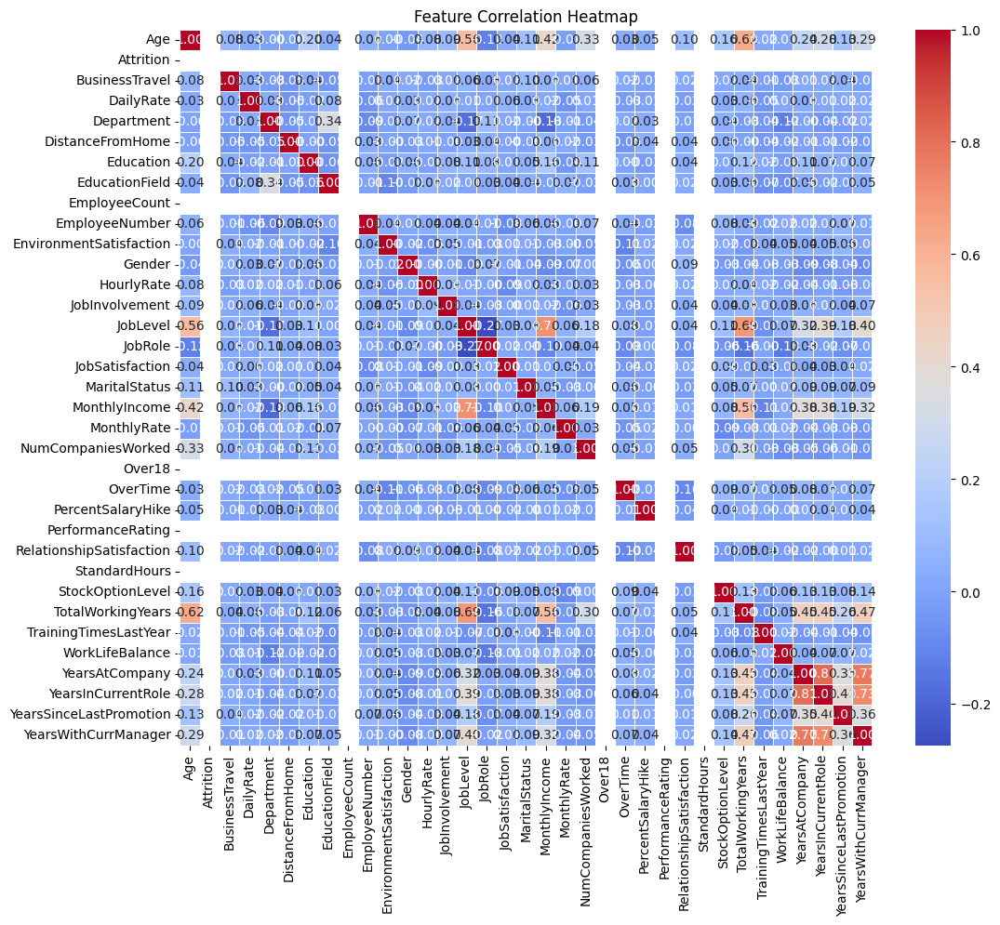

In [508]:
#  Feature Correlation(part of EDA)
# Feature correlation helps in identifying the strength and direction of relationships between features.
# Correlation matrices and heatmaps are useful tools for visualizing these relationships.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = X_train.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.show()


### 4.7 Feature Importance


* Helps in identifying which features are most predictive of churn. Using a model like a Random Forest, you can extract feature importances to
understand which features have the most impact on the model's predictions.
*   **Gradient Boosting Feature Importance:**
**How It Works:** Similar to Random Forests, gradient boosting algorithms (like XGBoost, LightGBM) provide feature importances based on the contribution to reducing the impurity or error in the model.
*Why Use IT: *Often used when working with boosting algorithms; it can
provide more nuanced insights compared to Random Forests because boosting models are usually more accurate.
**Why We Used Random Forest for Feature Importance:**
**Stability:** Random Forests provide more stable estimates of feature importance due to averaging over many trees.
**Handling Non-Linearity**: They can capture non-linear relationships between features and the target variable, making the importance more meaningful in such contexts.
**Ease of Use**: Built-in feature importance methods make it straightforward to extract and interpret results.



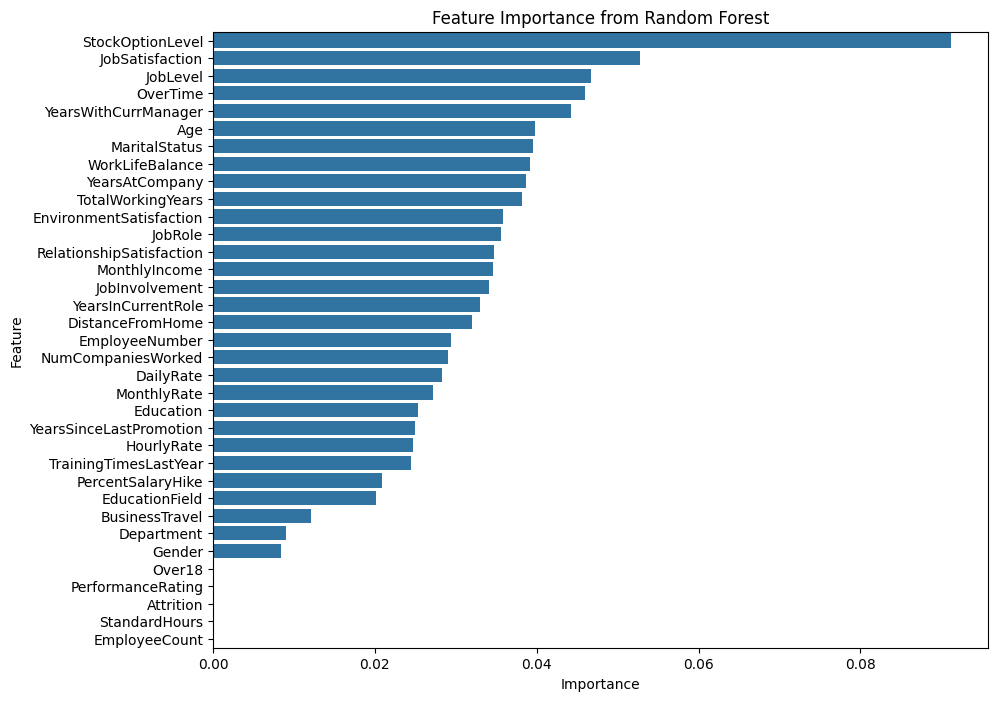

Selected Important Features:
['StockOptionLevel', 'JobSatisfaction'] 2


In [509]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier


# Initialize and fit a Random Forest model on the training data
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Get feature importances from the Random Forest model
feature_importances = rf_model.feature_importances_

# Create a DataFrame for better visualization
features_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
features_df = features_df.sort_values(by='Importance', ascending=False)

# Plot the feature importance
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=features_df)
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Define a threshold for importance
importance_threshold = 0.05  # Example threshold value, adjust based on your needs

# Select important features based on the threshold
important_features = features_df[features_df['Importance'] > importance_threshold]['Feature']

# Create a new DataFrame with only the important features
X_train_important = X_train[important_features]

# Print the selected important features
print("Selected Important Features:")
print(important_features.tolist(),len(important_features.tolist()))


### 5 Baseline Model Building

In [510]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score, confusion_matrix, roc_curve, ConfusionMatrixDisplay, classification_report  # Add classification_report here
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import xgboost as xgb
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split


X_train = X_train[important_features]


# Define additional baseline models
baseline_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'SVM': SVC(random_state=42, probability=True),  # SVC needs probability=True for ROC
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': LGBMClassifier(),
    'Neural Network': MLPClassifier(max_iter=1000)
}

# Store baseline results

baseline_results = {}

# Loop through baseline models, train, and evaluate on training data only
for model_name, model in baseline_models.items():
    # Train the model on X_train and y_train
    model.fit(X_train, y_train)

    # Predict and evaluate on training data
    y_train_pred = model.predict(X_train)
    y_train_prob = model.predict_proba(X_train)[:, 1] if hasattr(model, "predict_proba") else y_train_pred
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_report = classification_report(y_train, y_train_pred, output_dict=True)
    train_auc_roc = roc_auc_score(y_train, y_train_prob)
    conf_matrix = confusion_matrix(y_train, y_train_pred)

    # Store results
    baseline_results[model_name] = {
        'Training Accuracy': train_accuracy,
        'Training Classification Report': train_report,
        'Training AUC-ROC': train_auc_roc,
        'Confusion Matrix': conf_matrix
    }

    # Print results for training data
    print(f"\n{model_name} Performance on Training Data:")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print(f"Training AUC-ROC: {train_auc_roc:.4f}")
    print("Training Classification Report:")
    print(classification_report(y_train, y_train_pred))

# Choose the best baseline model based on training accuracy
best_baseline_model_name = max(baseline_results, key=lambda x: baseline_results[x]['Training Accuracy'])
best_baseline_accuracy = baseline_results[best_baseline_model_name]['Training Accuracy']
print(f"\nBest Baseline Model on Training Data: {best_baseline_model_name} with Training Accuracy: {best_baseline_accuracy:.4f}")

# Evaluate the best model on X_train
best_model = baseline_models[best_baseline_model_name]



Logistic Regression Performance on Training Data:
Training Accuracy: 0.6488
Training AUC-ROC: 0.6779
Training Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.61      0.63       988
           1       0.64      0.69      0.66       988

    accuracy                           0.65      1976
   macro avg       0.65      0.65      0.65      1976
weighted avg       0.65      0.65      0.65      1976


Decision Tree Performance on Training Data:
Training Accuracy: 0.8462
Training AUC-ROC: 0.9091
Training Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.87       988
           1       1.00      0.69      0.82       988

    accuracy                           0.85      1976
   macro avg       0.88      0.85      0.84      1976
weighted avg       0.88      0.85      0.84      1976


K-Nearest Neighbors Performance on Training Data:
Training Accuracy: 0.8244
Trainin

### 6 Evaluation of best model


Decision Tree Detailed Evaluation on Training Data:
Accuracy: 0.8462
Precision: 1.0000
Recall: 0.6923
F1-Score: 0.8182
AUC-ROC: 0.9091


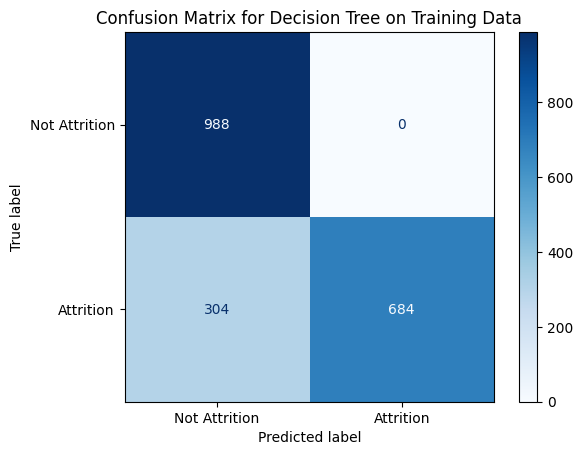

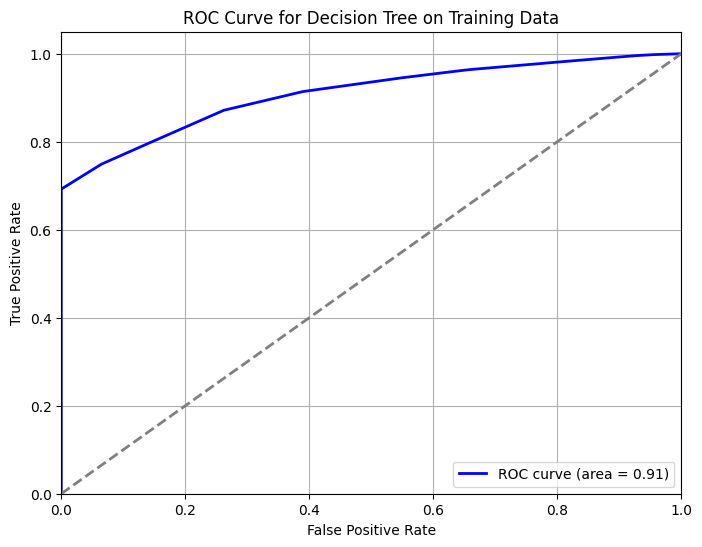

In [511]:

# Train the best model on the training data
best_model.fit(X_train, y_train)

# Predict on the training data
y_train_pred = best_model.predict(X_train)
y_train_prob = best_model.predict_proba(X_train)[:, 1] if hasattr(best_model, "predict_proba") else y_train_pred

# Calculate evaluation metrics
accuracy = accuracy_score(y_train, y_train_pred)
precision, recall, f1, _ = precision_recall_fscore_support(y_train, y_train_pred, average='binary')
roc_auc = roc_auc_score(y_train, y_train_prob)
conf_matrix = confusion_matrix(y_train, y_train_pred)

# Print evaluation metrics
print(f"\n{best_baseline_model_name} Detailed Evaluation on Training Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"AUC-ROC: {roc_auc:.4f}")

# Confusion Matrix Visualization
conf_matrix_disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['Not Attrition', 'Attrition'])
conf_matrix_disp.plot(cmap='Blues', values_format='d')
plt.title(f'Confusion Matrix for {best_baseline_model_name} on Training Data')
plt.show()

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_train, y_train_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve for {best_baseline_model_name} on Training Data')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### 6.1 Cross-Validation

In [512]:
# Cross-Validation
# We will perform k-fold cross-validation to evaluate the best model's performance.


In [513]:
# Cross-Validation

from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, accuracy_score

# Define the best model based on previous results
best_model_name = best_baseline_model_name
best_model = baseline_models[best_model_name]

# Cross-Validation
print(f"\nPerforming Cross-Validation for {best_model_name}...")

# Use cross_val_score to perform k-fold cross-validation
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='accuracy')

print(f"Cross-Validation Accuracy Scores: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {cv_scores.mean():.4f}")
print(f"Standard Deviation of Cross-Validation Accuracy: {cv_scores.std():.4f}")



Performing Cross-Validation for Decision Tree...
Cross-Validation Accuracy Scores: [0.52525253 0.91898734 0.91392405 0.93670886 0.91139241]
Mean Cross-Validation Accuracy: 0.8413
Standard Deviation of Cross-Validation Accuracy: 0.1582


### 6.2 Hyperparameter Tuning and Regularization

In [514]:
# 4. Hyperparameter Tuning
# We'll use Grid Search to find the best hyperparameters for the selected model

# To perform hyperparameter tuning on the best model, you can use techniques like
# Grid Search or Random Search. Grid Search is more exhaustive and checks all possible combinations of hyperparameters,
# while Random Search is faster but less exhaustive. Here’s how you can use Grid Search for hyperparameter tuning on your best model:

In [515]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters to tune for the best model
if best_model_name == 'Logistic Regression':
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization strength
        'solver': ['lbfgs', 'liblinear']      # Optimization algorithms
    }
elif best_model_name == 'Decision Tree':
    param_grid = {
        'max_depth': [None, 10, 20, 30, 40, 50],  # Maximum depth of the tree
        'min_samples_split': [2, 5, 10]           # Minimum number of samples required to split an internal node
    }
elif best_model_name == 'K-Nearest Neighbors':
    param_grid = {
        'n_neighbors': [3, 5, 7, 9, 11],          # Number of neighbors to use
        'weights': ['uniform', 'distance']        # Weight function used in prediction
    }
elif best_model_name == 'Naive Bayes':
    param_grid = {}  # Naive Bayes typically doesn't require hyperparameter tuning
elif best_model_name == 'SVM':
    param_grid = {
        'C': [0.1, 1, 10, 100],            # Regularization parameter
        'kernel': ['linear', 'rbf', 'poly']  # Kernel type
    }
elif best_model_name == 'XGBoost':
    param_grid = {
        'n_estimators': [50, 100, 200],           # Number of boosting stages to be run
        'learning_rate': [0.01, 0.1, 0.2],        # Step size shrinkage
        'max_depth': [3, 6, 9],                    # Maximum depth of trees
        'alpha': [0, 0.1, 0.2],                   # L1 regularization term
        'lambda': [0, 0.1, 0.2]                   # L2 regularization term
    }
elif best_model_name == 'LightGBM':
    param_grid = {
        'num_leaves': [31, 63, 127],              # Number of leaves in one tree
        'learning_rate': [0.01, 0.1, 0.2],        # Learning rate
        'n_estimators': [50, 100, 200],            # Number of boosting stages to be run
        'lambda_l1': [0, 0.1, 0.2],               # L1 regularization term
        'lambda_l2': [0, 0.1, 0.2]                # L2 regularization term
    }
elif best_model_name == 'Neural Network':
    param_grid = {
        'hidden_layer_sizes': [(50,), (100,), (50, 50)],  # Number of neurons in the hidden layers
        'activation': ['tanh', 'relu'],                    # Activation function
        'solver': ['adam', 'sgd'],                         # Optimizer
        'alpha': [0.0001, 0.001, 0.01]                     # Regularization parameter
    }
else:
    raise ValueError("Model not recognized for hyperparameter tuning.")

# Initialize the GridSearchCV
grid_search = GridSearchCV(estimator=best_model, param_grid=param_grid,
                           scoring='accuracy', cv=5, n_jobs=-1, verbose=1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print(f"\nBest Hyperparameters for {best_model_name}:")
print(grid_search.best_params_)
print(f"Best Accuracy Score from Grid Search: {grid_search.best_score_:.4f}")

# Optionally, you can retrain the model with the best hyperparameters
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 18 candidates, totalling 90 fits

Best Hyperparameters for Decision Tree:
{'max_depth': None, 'min_samples_split': 2}
Best Accuracy Score from Grid Search: 0.8413


###6.3 Rebuilding the best model with hyper-parameters and regularization

In [516]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# 1. Retrieve the best parameters
best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# 2. Rebuild the best model with the selected parameters
if best_model_name == 'Logistic Regression':
    best_model = LogisticRegression(**best_params)
elif best_model_name == 'Decision Tree':
    best_model = DecisionTreeClassifier(**best_params)
elif best_model_name == 'K-Nearest Neighbors':
    best_model = KNeighborsClassifier(**best_params)
elif best_model_name == 'Naive Bayes':
    best_model = GaussianNB()  # Naive Bayes typically does not need hyperparameter tuning
elif best_model_name == 'SVM':
    best_model = SVC(**best_params)
elif best_model_name == 'XGBoost':
    best_model = xgb.XGBClassifier(**best_params)
elif best_model_name == 'LightGBM':
    best_model = lgb.LGBMClassifier(**best_params)
elif best_model_name == 'Neural Network':
    best_model = MLPClassifier(**best_params)
else:
    raise ValueError("Model not recognized for hyperparameter tuning.")

# 3. Fit the best model on the training data
best_model.fit(X_train, y_train)

Best Hyperparameters: {'max_depth': None, 'min_samples_split': 2}


DecisionTreeClassifier()

In [517]:
print(X_train.columns)

Index(['StockOptionLevel', 'JobSatisfaction'], dtype='object')


In [518]:
# X_test -> prepare for prediction

categorical_cols = data.select_dtypes(include=['object']).columns
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns

X_test_data_encoded = encode_categorical_data(X_test, categorical_cols, encoding_type='frequency')

X_test_data_scaled = scale_features(X_test_data_encoded, numeric_cols, scaling_type='standard')

Frequency Encoding applied to column BusinessTravel
Frequency Encoding applied to column Department
Frequency Encoding applied to column EducationField
Frequency Encoding applied to column Gender
Frequency Encoding applied to column JobRole
Frequency Encoding applied to column MaritalStatus
Frequency Encoding applied to column Over18
Frequency Encoding applied to column OverTime
Standard Scaling applied.


In [519]:
X_test_data_encoded[important_features].head()

,StockOptionLevel,JobSatisfaction
442,-0.942376,1.167525
1091,-0.942376,-0.643833
981,0.316981,0.261846
785,0.316981,1.167525
1332,-0.942376,1.167525


In [520]:
# Best Model to Test Data

from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix

X_test = X_test_data_encoded[important_features]

# Predict on the test data
y_test_pred = best_model.predict(X_test)
y_test_prob = best_model.predict_proba(X_test)[:, 1] if hasattr(best_model, "predict_proba") else y_test_pred

# Calculate performance metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_auc_roc = roc_auc_score(y_test, y_test_prob)
test_report = classification_report(y_test, y_test_pred, output_dict=True)
conf_matrix_test = confusion_matrix(y_test, y_test_pred)

# Print results for test data
print(f"\nBest Model Performance on Test Data:")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test AUC-ROC: {test_auc_roc:.4f}")
print("Test Classification Report:")
print(classification_report(y_test, y_test_pred))



Best Model Performance on Test Data:
Test Accuracy: 0.1871
Test AUC-ROC: 0.4880
Test Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.04      0.07       245
           1       0.16      0.94      0.28        49

    accuracy                           0.19       294
   macro avg       0.46      0.49      0.17       294
weighted avg       0.65      0.19      0.10       294



In [521]:
# Save the model and predictions
import joblib
joblib.dump(best_model, 'best_model.pkl')

y_pred = best_model.predict(X_test)

import pandas as pd
predictions_df = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred})
predictions_df.to_csv('model_predictions_employee_attrition.csv', index=False)

In [522]:
import lime
import lime.lime_tabular
import numpy as np

if isinstance(X_train, pd.DataFrame):
    X_train_np = X_train.to_numpy()
else:
    X_train_np = X_train

# Create a LIME explainer object
# class_names is optional; replace with the actual class names if you have them
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_np,
    mode='classification',
    feature_names=X_train.columns if isinstance(X_train, pd.DataFrame) else None,
    class_names=['No', 'Yes'],  # Example for binary classification; change as needed
    discretize_continuous=True,
    random_state=42
)

# Choose an instance to explain (e.g., the first instance in X_train)
instance_idx = 0
instance_to_explain = X_train_np[instance_idx].reshape(1, -1)

# Generate explanation for the instance
exp = explainer.explain_instance(
    instance_to_explain[0],
    best_model.predict_proba,  # Model's prediction probability function
    num_features=10  # Number of top features to display in explanation
)

# Display the explanation
exp.show_in_notebook(show_all=False)

# Alternatively, to display in the console:
print(exp.as_list())


[('-0.54 < StockOptionLevel <= 0.48', 0.0028135161312240775), ('JobSatisfaction > 0.75', -0.0023752813807895947)]


In [523]:
import lime
import lime.lime_tabular
import numpy as np

if isinstance(X_test, pd.DataFrame):
    X_test_np = X_test.to_numpy()
else:
    X_test_np = X_test


# class_names is optional; replace with the actual class names if you have them
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_test_np,
    mode='classification',
    feature_names=X_test.columns if isinstance(X_test, pd.DataFrame) else None,
    class_names=['No', 'Yes'],  # Example for binary classification; change as needed
    discretize_continuous=True,
    random_state=42
)

# Choose an instance to explain (e.g., the first instance in X_train)
instance_idx = 0
instance_to_explain = X_test_np[instance_idx].reshape(1, -1)

# Generate explanation for the instance
exp = explainer.explain_instance(
    instance_to_explain[0],
    best_model.predict_proba,  # Model's prediction probability function
    num_features=10  # Number of top features to display in explanation
)

# Display the explanation
exp.show_in_notebook(show_all=False)

# Alternatively, to display in the console:
print(exp.as_list())


[('StockOptionLevel <= -0.94', 0.1047523077850595), ('0.26 < JobSatisfaction <= 1.17', -0.007559192515066304)]
